In [2]:
import MetaTrader5 as mt5
from datetime import datetime
import time
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn import metrics
import os


In [26]:
if not mt5.initialize():
    print("initialize() failed, error code =",mt5.last_error())
    quit()

In [27]:
symbol = 'MGLU3'
symbol_info = mt5.symbol_info(symbol)

In [28]:
price_petr = mt5.copy_rates_from(symbol, mt5.TIMEFRAME_M1, time.time(), 99999)
df = pd.DataFrame(price_petr)
# Converte o tipo de formato da data
df['time'] = pd.to_datetime(df['time'], unit='s')

In [29]:
df['Dia'] = df['time'].dt.day
df['Mes'] = df['time'].dt.month
df['Ano'] = df['time'].dt.year

In [30]:
df=df.loc[(df["Mes"] == 11) |(df["Mes"] == 12)]
df.reset_index(drop=True, inplace=True)
print(df)

                     time  open  high   low  close  tick_volume  spread  \
0     2024-11-01 10:07:00  9.59  9.59  9.53   9.53          167       1   
1     2024-11-01 10:08:00  9.53  9.53  9.46   9.50          104       1   
2     2024-11-01 10:09:00  9.50  9.51  9.44   9.48          111       1   
3     2024-11-01 10:10:00  9.46  9.49  9.42   9.45           80       1   
4     2024-11-01 10:11:00  9.45  9.45  9.43   9.44           55       1   
...                   ...   ...   ...   ...    ...          ...     ...   
17762 2024-12-30 17:50:00  6.53  6.54  6.52   6.52           21       1   
17763 2024-12-30 17:51:00  6.52  6.54  6.52   6.53           35       1   
17764 2024-12-30 17:52:00  6.53  6.54  6.52   6.53           48       1   
17765 2024-12-30 17:53:00  6.53  6.53  6.51   6.53           28       1   
17766 2024-12-30 17:54:00  6.53  6.53  6.50   6.50          194       1   

       real_volume  Dia  Mes   Ano  
0           209400    1   11  2024  
1           140300    1  

In [31]:
inicio = time.time()

x=0
t=0
cont_1=0
   
df["Resposta"]= -1

for k in range (1,17765,1):
    
    a=0
    abertura_p = df.at[k-1,'close']
    tempo =0

    for t in range (k,17766,1):
     
        if((df.at[t,'high']-abertura_p)>=0.0199):
            df.at[k,"Resposta"]=1
            a=1
        if((abertura_p-df.at[t,'low'])>=0.0199):
            df.at[k,"Resposta"]=0
            a=1    

        if (a==1):
            break


            
            
print(pd.Series(df["Resposta"]).value_counts())

fim = time.time()
print(fim - inicio)

 0    9330
 1    8434
-1       3
Name: Resposta, dtype: int64
1.527355670928955


In [32]:
def get_data():
           
    base1['a1']= (base1['high'].shift(1) - base1['low'].shift(1))/base1['low'].shift(1)
    base1['a2']= (base1['high'].shift(1) - base1['open'].shift(1))/base1['open'].shift(1)
    base1['a3']= (base1['high'].shift(1) - base1['close'].shift(1))/base1['close'].shift(1)
    base1['a4']= (base1['close'].shift(1) - base1['low'].shift(1))/base1['low'].shift(1)
    base1['a5']= (base1['close'].shift(1) - base1['open'].shift(1))/base1['open'].shift(1)
    base1['a6']= (base1['open'].shift(1) - base1['low'].shift(1))/base1['low'].shift(1)
    
    base1['a7']= (base1['high'].shift(2) - base1['low'].shift(2))/base1['low'].shift(2)
    base1['a8']= (base1['high'].shift(2) - base1['open'].shift(2))/base1['open'].shift(2)
    base1['a9']= (base1['high'].shift(2) - base1['close'].shift(2))/base1['close'].shift(2)
    base1['a10']= (base1['close'].shift(2) - base1['low'].shift(2))/base1['low'].shift(2)
    base1['a11']= (base1['close'].shift(2) - base1['open'].shift(2))/base1['open'].shift(2)
    base1['a12']= (base1['open'].shift(2) - base1['low'].shift(2))/base1['low'].shift(2)
    
    base1['a13']= (base1['high'].shift(3) - base1['low'].shift(3))/base1['low'].shift(3)
    base1['a14']= (base1['high'].shift(3) - base1['open'].shift(3))/base1['open'].shift(3)
    base1['a15']= (base1['high'].shift(3) - base1['close'].shift(3))/base1['close'].shift(3)
    base1['a16']= (base1['close'].shift(3) - base1['low'].shift(3))/base1['low'].shift(3)
    base1['a17']= (base1['close'].shift(3) - base1['open'].shift(3))/base1['open'].shift(3)
    base1['a18']= (base1['open'].shift(3) - base1['low'].shift(3))/base1['low'].shift(3)
    
    base1['a19']= (base1['high'].shift(4) - base1['low'].shift(4))/base1['low'].shift(4)
    base1['a20']= (base1['high'].shift(4) - base1['open'].shift(4))/base1['open'].shift(4)
    base1['a21']= (base1['high'].shift(4) - base1['close'].shift(4))/base1['close'].shift(4)
    base1['a22']= (base1['close'].shift(4) - base1['low'].shift(4))/base1['low'].shift(4)
    base1['a23']= (base1['close'].shift(4) - base1['open'].shift(4))/base1['open'].shift(4)
    base1['a24']= (base1['open'].shift(4) - base1['low'].shift(4))/base1['low'].shift(4)
    
    base1['a25']= (base1['high'].shift(5) - base1['low'].shift(5))/base1['low'].shift(5)
    base1['a26']= (base1['high'].shift(5) - base1['open'].shift(5))/base1['open'].shift(5)
    base1['a27']= (base1['high'].shift(5) - base1['close'].shift(5))/base1['close'].shift(5)
    base1['a28']= (base1['close'].shift(5) - base1['low'].shift(5))/base1['low'].shift(5)
    base1['a29']= (base1['close'].shift(5) - base1['open'].shift(5))/base1['open'].shift(5)
    base1['a30']= (base1['open'].shift(5) - base1['low'].shift(5))/base1['low'].shift(5)
    
    base1['a31']= (base1['high'].shift(6) - base1['low'].shift(6))/base1['low'].shift(6)
    base1['a32']= (base1['high'].shift(6) - base1['open'].shift(6))/base1['open'].shift(6)
    base1['a33']= (base1['high'].shift(6) - base1['close'].shift(6))/base1['close'].shift(6)
    base1['a34']= (base1['close'].shift(6) - base1['low'].shift(6))/base1['low'].shift(6)
    base1['a35']= (base1['close'].shift(6) - base1['open'].shift(6))/base1['open'].shift(6)
    base1['a36']= (base1['open'].shift(6) - base1['low'].shift(6))/base1['low'].shift(6)
    
    base1['a37']= (base1['high'].shift(7) - base1['low'].shift(7))/base1['low'].shift(7)
    base1['a38']= (base1['high'].shift(7) - base1['open'].shift(7))/base1['open'].shift(7)
    base1['a39']= (base1['high'].shift(7) - base1['close'].shift(7))/base1['close'].shift(7)
    base1['a40']= (base1['close'].shift(7) - base1['low'].shift(7))/base1['low'].shift(7)
    base1['a41']= (base1['close'].shift(7) - base1['open'].shift(7))/base1['open'].shift(7)
    base1['a42']= (base1['open'].shift(7) - base1['low'].shift(7))/base1['low'].shift(7)
    
    base1['a43']= (base1['high'].shift(8) - base1['low'].shift(8))/base1['low'].shift(8)
    base1['a44']= (base1['high'].shift(8) - base1['open'].shift(8))/base1['open'].shift(8)
    base1['a45']= (base1['high'].shift(8) - base1['close'].shift(8))/base1['close'].shift(8)
    base1['a46']= (base1['close'].shift(8) - base1['low'].shift(8))/base1['low'].shift(8)
    base1['a47']= (base1['close'].shift(8) - base1['open'].shift(8))/base1['open'].shift(8)
    base1['a48']= (base1['open'].shift(8) - base1['low'].shift(8))/base1['low'].shift(8)
    
    base1['a49']= (base1['high'].shift(9) - base1['low'].shift(9))/base1['low'].shift(9)
    base1['a50']= (base1['high'].shift(9) - base1['open'].shift(9))/base1['open'].shift(9)
    base1['a51']= (base1['high'].shift(9) - base1['close'].shift(9))/base1['close'].shift(9)
    base1['a52']= (base1['close'].shift(9) - base1['low'].shift(9))/base1['low'].shift(9)
    base1['a53']= (base1['close'].shift(9) - base1['open'].shift(9))/base1['open'].shift(9)
    base1['a54']= (base1['open'].shift(9) - base1['low'].shift(9))/base1['low'].shift(9)
    
    base1['a55']= (base1['high'].shift(10) - base1['low'].shift(10))/base1['low'].shift(10)
    base1['a56']= (base1['high'].shift(10) - base1['open'].shift(10))/base1['open'].shift(10)
    base1['a57']= (base1['high'].shift(10) - base1['close'].shift(10))/base1['close'].shift(10)
    base1['a58']= (base1['close'].shift(10) - base1['low'].shift(10))/base1['low'].shift(10)
    base1['a59']= (base1['close'].shift(10) - base1['open'].shift(10))/base1['open'].shift(10)
    base1['a60']= (base1['open'].shift(10) - base1['low'].shift(10))/base1['low'].shift(10)
    
    base1['a61']= (base1['high'].shift(11) - base1['low'].shift(11))/base1['low'].shift(11)
    base1['a62']= (base1['high'].shift(11) - base1['open'].shift(11))/base1['open'].shift(11)
    base1['a63']= (base1['high'].shift(11) - base1['close'].shift(11))/base1['close'].shift(11)
    base1['a64']= (base1['close'].shift(11) - base1['low'].shift(11))/base1['low'].shift(11)
    base1['a65']= (base1['close'].shift(11) - base1['open'].shift(11))/base1['open'].shift(11)
    base1['a66']= (base1['open'].shift(11) - base1['low'].shift(11))/base1['low'].shift(11)
    
    base1['a67']= (base1['high'].shift(12) - base1['low'].shift(12))/base1['low'].shift(12)
    base1['a68']= (base1['high'].shift(12) - base1['open'].shift(12))/base1['open'].shift(12)
    base1['a60']= (base1['high'].shift(12) - base1['close'].shift(12))/base1['close'].shift(12)
    base1['a70']= (base1['close'].shift(12) - base1['low'].shift(12))/base1['low'].shift(12)
    base1['a71']= (base1['close'].shift(12) - base1['open'].shift(12))/base1['open'].shift(12)
    base1['a72']= (base1['open'].shift(12) - base1['low'].shift(12))/base1['low'].shift(12)
    
    base1['a73']= (base1['high'].shift(13) - base1['low'].shift(13))/base1['low'].shift(13)
    base1['a74']= (base1['high'].shift(13) - base1['open'].shift(13))/base1['open'].shift(13)
    base1['a75']= (base1['high'].shift(13) - base1['close'].shift(13))/base1['close'].shift(13)
    base1['a76']= (base1['close'].shift(13) - base1['low'].shift(13))/base1['low'].shift(13)
    base1['a77']= (base1['close'].shift(13) - base1['open'].shift(13))/base1['open'].shift(13)
    base1['a78']= (base1['open'].shift(13) - base1['low'].shift(13))/base1['low'].shift(13)
    
    base1['a79']= (base1['high'].shift(14) - base1['low'].shift(14))/base1['low'].shift(14)
    base1['a80']= (base1['high'].shift(14) - base1['open'].shift(14))/base1['open'].shift(14)
    base1['a81']= (base1['high'].shift(14) - base1['close'].shift(14))/base1['close'].shift(14)
    base1['a82']= (base1['close'].shift(14) - base1['low'].shift(14))/base1['low'].shift(14)
    base1['a83']= (base1['close'].shift(14) - base1['open'].shift(14))/base1['open'].shift(14)
    base1['a84']= (base1['open'].shift(14) - base1['low'].shift(14))/base1['low'].shift(14)
    
    base1['a85']= (base1['high'].shift(15) - base1['low'].shift(15))/base1['low'].shift(15)
    base1['a86']= (base1['high'].shift(15) - base1['open'].shift(15))/base1['open'].shift(15)
    base1['a87']= (base1['high'].shift(15) - base1['close'].shift(15))/base1['close'].shift(15)
    base1['a88']= (base1['close'].shift(15) - base1['low'].shift(15))/base1['low'].shift(15)
    base1['a89']= (base1['close'].shift(15) - base1['open'].shift(15))/base1['open'].shift(15)
    base1['a90']= (base1['open'].shift(15) - base1['low'].shift(15))/base1['low'].shift(15)
    
    base1['a91']= base1['tick_volume'].shift(1)
    base1['a92']= base1['tick_volume'].shift(2)
    base1['a93']= base1['tick_volume'].shift(3)
    base1['a94']= base1['tick_volume'].shift(4)
    base1['a95']= base1['tick_volume'].shift(5)
    base1['a96']= base1['tick_volume'].shift(6)
    base1['a97']= base1['tick_volume'].shift(7)
    base1['a98']= base1['tick_volume'].shift(8)
    base1['a99']= base1['tick_volume'].shift(9)
    base1['a100']= base1['tick_volume'].shift(10)
    base1['a101']= base1['tick_volume'].shift(11)
    base1['a102']= base1['tick_volume'].shift(12)
    base1['a103']= base1['tick_volume'].shift(13)
    base1['a104']= base1['tick_volume'].shift(14)
    base1['a105']= base1['tick_volume'].shift(15)
    
    base1['a106']= base1['real_volume'].shift(1)
    base1['a107']= base1['real_volume'].shift(2)
    base1['a108']= base1['real_volume'].shift(3)
    base1['a109']= base1['real_volume'].shift(4)
    base1['a110']= base1['real_volume'].shift(5)
    base1['a111']= base1['real_volume'].shift(6)
    base1['a112']= base1['real_volume'].shift(7)
    base1['a113']= base1['real_volume'].shift(8)
    base1['a114']= base1['real_volume'].shift(9)
    base1['a115']= base1['real_volume'].shift(10)
    base1['a116']= base1['real_volume'].shift(11)
    base1['a117']= base1['real_volume'].shift(12)
    base1['a118']= base1['real_volume'].shift(13)
    base1['a119']= base1['real_volume'].shift(14)
    base1['a120']= base1['real_volume'].shift(15)
    
    base1['a121']= (base1['open'].shift(1) - base1['close'].shift(2))/base1['close'].shift(2)
    base1['a122']= (base1['open'].shift(2) - base1['close'].shift(3))/base1['close'].shift(3)
    base1['a123']= (base1['open'].shift(3) - base1['close'].shift(4))/base1['close'].shift(4)
    base1['a124']= (base1['open'].shift(4) - base1['close'].shift(5))/base1['close'].shift(5)
    base1['a125']= (base1['open'].shift(5) - base1['close'].shift(6))/base1['close'].shift(6)
    base1['a126']= (base1['open'].shift(6) - base1['close'].shift(7))/base1['close'].shift(7)
    base1['a127']= (base1['open'].shift(7) - base1['close'].shift(8))/base1['close'].shift(8)
    base1['a128']= (base1['open'].shift(8) - base1['close'].shift(9))/base1['close'].shift(9)
    base1['a129']= (base1['open'].shift(9) - base1['close'].shift(10))/base1['close'].shift(10)
    base1['a130']= (base1['open'].shift(10) - base1['close'].shift(11))/base1['close'].shift(11)
    base1['a131']= (base1['open'].shift(11) - base1['close'].shift(12))/base1['close'].shift(12)
    base1['a132']= (base1['open'].shift(12) - base1['close'].shift(13))/base1['close'].shift(13)
    base1['a133']= (base1['open'].shift(13) - base1['close'].shift(14))/base1['close'].shift(14)
    base1['a134']= (base1['open'].shift(14) - base1['close'].shift(15))/base1['close'].shift(15)

    
    base1['Hora'] = base1['time'].dt.hour


    return base1.dropna()

    

In [33]:
pd.crosstab(df['Dia'],df['Resposta'])

Resposta,-1,0,1
Dia,,,
1,1,256,151
2,0,244,228
3,0,230,242
4,0,444,496
5,0,487,450
6,0,556,383
7,0,265,207
8,0,253,215
9,0,267,205


In [34]:
df['aux']=0
cont=0

for k in range (1,17766,1):
    
    if(df.at[k,'Dia'] != df.at[k-1,'Dia']):
        cont=0
    if(cont<=16):
        df.at[k,'aux']=1
        cont=cont+1

In [35]:
base1=df
pd.crosstab(base1['Mes'],base1['Resposta'])

Resposta,-1,0,1
Mes,,,
11,1,4560,4297
12,2,4770,4137


In [36]:
pd.crosstab(base1['Mes'],base1['aux'])

aux,0,1
Mes,,
11,8535,323
12,8586,323


In [37]:
base1=get_data()
base1=base1.loc[(base1["aux"]==0)]
base1=base1.loc[(base1["Resposta"]>-1)]
base1.reset_index(drop=True, inplace=True)
pd.crosstab(base1['aux'],base1['Resposta'])

C:\Users\belas\AppData\Local\Temp\ipykernel_20448\2499869803.py:112: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  base1['a95']= base1['tick_volume'].shift(5)
C:\Users\belas\AppData\Local\Temp\ipykernel_20448\2499869803.py:113: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  base1['a96']= base1['tick_volume'].shift(6)
C:\Users\belas\AppData\Local\Temp\ipykernel_20448\2499869803.py:114: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  

Resposta,0,1
aux,,
0,8924,8194


In [38]:
y=base1["Resposta"]

low0=base1["low"]
open0=base1["open"]
close0=base1["close"]
high0=base1["high"]

print(pd.Series(y).value_counts())

0    8924
1    8194
Name: Resposta, dtype: int64


In [39]:
#Definição das Covariáveis
X=base1
drop_columns=["aux","low","open","close","high", "time","Resposta","Mes", "Dia","Ano","tick_volume","spread", "real_volume"]
X.drop(labels=drop_columns, axis=1, inplace=True)
print(X)

             a1        a2        a3        a4        a5        a6        a7  \
0      0.004315  0.004315  0.000000  0.004315  0.004315  0.000000  0.002155   
1      0.005400  0.001075  0.003233  0.002160 -0.002151  0.004320  0.004315   
2      0.002155  0.001076  0.002155  0.000000 -0.001076  0.001078  0.005400   
3      0.005417  0.000000  0.005417  0.000000 -0.005388  0.005417  0.002155   
4      0.002169  0.001083  0.001083  0.001085  0.000000  0.001085  0.005417   
...         ...       ...       ...       ...       ...       ...       ...   
17113  0.001536  0.001536  0.001536  0.000000  0.000000  0.000000  0.003077   
17114  0.001536  0.001536  0.001536  0.000000  0.000000  0.000000  0.001536   
17115  0.003072  0.003072  0.000000  0.003072  0.003072  0.000000  0.001536   
17116  0.003067  0.001531  0.003067  0.000000 -0.001531  0.001534  0.003072   
17117  0.003067  0.003067  0.001531  0.001534  0.001534  0.000000  0.003067   

             a8        a9       a10  ...      a126 

In [40]:
#pd.cut(df['ext price'], bins=4)

inicio = time.time()

gb_clf = RandomForestClassifier(n_estimators=2000, criterion="entropy", min_samples_leaf=10, max_depth=10, random_state=42)
gb_clf.fit(X, y)

fim = time.time()
print(fim - inicio)

407.6629705429077


Accuracy score (training): 0.740


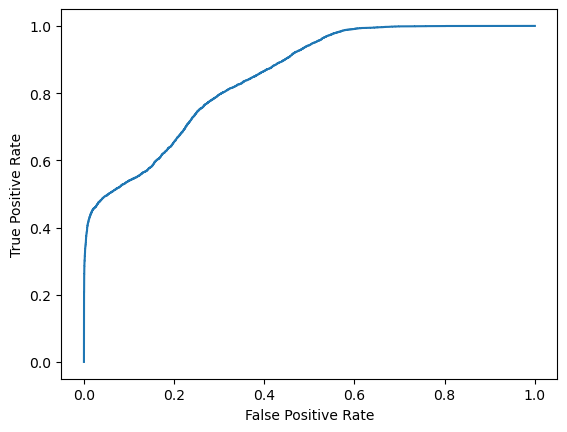

           Prob
0      0.345814
1      0.511556
2      0.491699
3      0.602714
4      0.524333
...         ...
17113  0.592349
17114  0.598690
17115  0.338267
17116  0.628287
17117  0.444568

[17118 rows x 1 columns]


In [41]:
print("Accuracy score (training): {0:.3f}".format(gb_clf.score(X, y)))

#define metrics
y_pred_proba =  gb_clf.predict_proba(X)[::,1]
fpr, tpr, _ = metrics.roc_curve(y,  y_pred_proba)

#create ROC curve
plt.plot(fpr,tpr)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

Tabela = pd.DataFrame(y_pred_proba, columns=['Prob'])
print(Tabela)


In [42]:
base=X
base['Resposta']=y
base['low']=low0
base['open']=open0
base['close']=close0
base['high']=high0
base['Prob']=y_pred_proba
base['Decile'] = pd.qcut(base['Prob'], 20, labels=False)
print(base)

result = base.groupby('Decile').agg({'Prob': ['mean', 'min', 'max']})
  
print("Mean, min, and max values of Score grouped by Decis")
print(result) 

pd.crosstab(base['Decile'],base['Resposta'])

             a1        a2        a3        a4        a5        a6        a7  \
0      0.004315  0.004315  0.000000  0.004315  0.004315  0.000000  0.002155   
1      0.005400  0.001075  0.003233  0.002160 -0.002151  0.004320  0.004315   
2      0.002155  0.001076  0.002155  0.000000 -0.001076  0.001078  0.005400   
3      0.005417  0.000000  0.005417  0.000000 -0.005388  0.005417  0.002155   
4      0.002169  0.001083  0.001083  0.001085  0.000000  0.001085  0.005417   
...         ...       ...       ...       ...       ...       ...       ...   
17113  0.001536  0.001536  0.001536  0.000000  0.000000  0.000000  0.003077   
17114  0.001536  0.001536  0.001536  0.000000  0.000000  0.000000  0.001536   
17115  0.003072  0.003072  0.000000  0.003072  0.003072  0.000000  0.001536   
17116  0.003067  0.001531  0.003067  0.000000 -0.001531  0.001534  0.003072   
17117  0.003067  0.003067  0.001531  0.001534  0.001534  0.000000  0.003067   

             a8        a9       a10  ...      a133 

Resposta,0,1
Decile,,
0,856,0
1,854,2
2,847,9
3,816,40
4,682,174
5,534,322
6,494,361
7,509,347
8,526,330


In [43]:
import pickle
with open("Modelo.pkl", "wb") as arquivo:
    pickle.dump(gb_clf, arquivo) 

# Validação

In [44]:
import pickle
with open("Modelo.pkl", "rb") as arquivo:
    gb_clf= pickle.load(arquivo) 

In [45]:
symbol="MGLU3"
price_petr = mt5.copy_rates_from(symbol, mt5.TIMEFRAME_M1, time.time(), 99999)
df = pd.DataFrame(price_petr)
# Converte o tipo de formato da data
df['time'] = pd.to_datetime(df['time'], unit='s')

In [46]:
df['Dia'] = df['time'].dt.day
df['Mes'] = df['time'].dt.month
df['Ano'] = df['time'].dt.year

In [47]:
df=df.loc[(df["Mes"] == 1)]
df.reset_index(drop=True, inplace=True)
print(df)

                    time  open  high   low  close  tick_volume  spread  \
0    2025-01-02 10:10:00  6.50  6.50  6.41   6.43          324       1   
1    2025-01-02 10:11:00  6.43  6.45  6.42   6.44           75       1   
2    2025-01-02 10:12:00  6.43  6.43  6.42   6.42           50       1   
3    2025-01-02 10:13:00  6.41  6.42  6.38   6.41          101       1   
4    2025-01-02 10:14:00  6.40  6.41  6.38   6.39           33       1   
...                  ...   ...   ...   ...    ...          ...     ...   
6991 2025-01-22 17:34:00  6.42  6.43  6.42   6.43           24       1   
6992 2025-01-22 17:35:00  6.43  6.44  6.42   6.43           47       0   
6993 2025-01-22 17:36:00  6.43  6.43  6.42   6.43           18       1   
6994 2025-01-22 17:37:00  6.43  6.43  6.42   6.43           29       1   
6995 2025-01-22 17:38:00  6.42  6.43  6.42   6.43            8       1   

      real_volume  Dia  Mes   Ano  
0          418200    2    1  2025  
1          322300    2    1  2025  
2  

In [48]:
inicio = time.time()

x=0
t=0
cont_1=0
   
df["Resposta"]= -1

for k in range (1,6995,1):
    
    
    a=0
    abertura_p = df.at[k-1,'close']
    tempo =0

    for t in range (k,6540,1):
     
        if((df.at[t,'high']-abertura_p)>=0.0099):
            df.at[k,"Resposta"]=1
            a=1
        if((abertura_p-df.at[t,'low'])>=0.0099):
            df.at[k,"Resposta"]=0
            a=1    

        if (a==1):
            break


            
            
print(pd.Series(df["Resposta"]).value_counts())

fim = time.time()
print(fim - inicio)

 0    3959
 1    2580
-1     457
Name: Resposta, dtype: int64
0.21144723892211914


In [49]:
df['aux']=0
cont=0

for k in range (1,6995,1):
    
    if(df.at[k,'Dia'] != df.at[k-1,'Dia']):
        cont=0
    if(cont<=16):
        df.at[k,'aux']=1
        cont=cont+1

In [50]:
base1=df
print(base1)

                    time  open  high   low  close  tick_volume  spread  \
0    2025-01-02 10:10:00  6.50  6.50  6.41   6.43          324       1   
1    2025-01-02 10:11:00  6.43  6.45  6.42   6.44           75       1   
2    2025-01-02 10:12:00  6.43  6.43  6.42   6.42           50       1   
3    2025-01-02 10:13:00  6.41  6.42  6.38   6.41          101       1   
4    2025-01-02 10:14:00  6.40  6.41  6.38   6.39           33       1   
...                  ...   ...   ...   ...    ...          ...     ...   
6991 2025-01-22 17:34:00  6.42  6.43  6.42   6.43           24       1   
6992 2025-01-22 17:35:00  6.43  6.44  6.42   6.43           47       0   
6993 2025-01-22 17:36:00  6.43  6.43  6.42   6.43           18       1   
6994 2025-01-22 17:37:00  6.43  6.43  6.42   6.43           29       1   
6995 2025-01-22 17:38:00  6.42  6.43  6.42   6.43            8       1   

      real_volume  Dia  Mes   Ano  Resposta  aux  
0          418200    2    1  2025        -1    0  
1        

In [51]:
pd.crosstab(base1['Mes'],base1['aux'])

aux,0,1
Mes,,
1,6741,255


In [52]:
base1=get_data()
base1=base1.loc[(base1["aux"]==0)]
base1.reset_index(drop=True, inplace=True)
print(base1)

                    time  open  high   low  close  tick_volume  spread  \
0    2025-01-02 10:28:00  6.40  6.40  6.39   6.39           66       1   
1    2025-01-02 10:29:00  6.39  6.43  6.39   6.39           78       1   
2    2025-01-02 10:30:00  6.39  6.40  6.38   6.38           52       1   
3    2025-01-02 10:31:00  6.38  6.39  6.37   6.38           60       1   
4    2025-01-02 10:32:00  6.39  6.39  6.35   6.35           60       1   
...                  ...   ...   ...   ...    ...          ...     ...   
6735 2025-01-22 17:34:00  6.42  6.43  6.42   6.43           24       1   
6736 2025-01-22 17:35:00  6.43  6.44  6.42   6.43           47       0   
6737 2025-01-22 17:36:00  6.43  6.43  6.42   6.43           18       1   
6738 2025-01-22 17:37:00  6.43  6.43  6.42   6.43           29       1   
6739 2025-01-22 17:38:00  6.42  6.43  6.42   6.43            8       1   

      real_volume  Dia  Mes  ...      a126      a127      a128      a129  \
0           46200    2    1  ...  0

C:\Users\belas\AppData\Local\Temp\ipykernel_20448\2499869803.py:112: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  base1['a95']= base1['tick_volume'].shift(5)
C:\Users\belas\AppData\Local\Temp\ipykernel_20448\2499869803.py:113: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  base1['a96']= base1['tick_volume'].shift(6)
C:\Users\belas\AppData\Local\Temp\ipykernel_20448\2499869803.py:114: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  

In [53]:
y=base1["Resposta"]

Dia=base1["Dia"]
Time=base1["time"]
low0=base1["low"]
open0=base1["open"]
close0=base1["close"]
high0=base1["high"]

In [54]:
X=base1
drop_columns=["aux","low","open","close","high", "time","Resposta","Mes", "Dia","Ano","tick_volume","spread", "real_volume"]
X.drop(labels=drop_columns, axis=1, inplace=True)
print(X)

            a1        a2        a3        a4        a5        a6        a7  \
0     0.001562  0.001562  0.001562  0.000000  0.000000  0.000000  0.006250   
1     0.001565  0.000000  0.001565  0.000000 -0.001563  0.001565  0.001562   
2     0.006260  0.006260  0.006260  0.000000  0.000000  0.000000  0.001565   
3     0.003135  0.001565  0.003135  0.000000 -0.001565  0.001567  0.006260   
4     0.003140  0.001567  0.001567  0.001570  0.000000  0.001570  0.003135   
...        ...       ...       ...       ...       ...       ...       ...   
6735  0.001558  0.001558  0.000000  0.001558  0.001558  0.000000  0.001558   
6736  0.001558  0.001558  0.000000  0.001558  0.001558  0.000000  0.001558   
6737  0.003115  0.001555  0.001555  0.001558  0.000000  0.001558  0.001558   
6738  0.001558  0.000000  0.000000  0.001558  0.000000  0.001558  0.003115   
6739  0.001558  0.000000  0.000000  0.001558  0.000000  0.001558  0.001558   

            a8        a9       a10  ...      a126      a127    

In [55]:
print(base1)

            a1        a2        a3        a4        a5        a6        a7  \
0     0.001562  0.001562  0.001562  0.000000  0.000000  0.000000  0.006250   
1     0.001565  0.000000  0.001565  0.000000 -0.001563  0.001565  0.001562   
2     0.006260  0.006260  0.006260  0.000000  0.000000  0.000000  0.001565   
3     0.003135  0.001565  0.003135  0.000000 -0.001565  0.001567  0.006260   
4     0.003140  0.001567  0.001567  0.001570  0.000000  0.001570  0.003135   
...        ...       ...       ...       ...       ...       ...       ...   
6735  0.001558  0.001558  0.000000  0.001558  0.001558  0.000000  0.001558   
6736  0.001558  0.001558  0.000000  0.001558  0.001558  0.000000  0.001558   
6737  0.003115  0.001555  0.001555  0.001558  0.000000  0.001558  0.001558   
6738  0.001558  0.000000  0.000000  0.001558  0.000000  0.001558  0.003115   
6739  0.001558  0.000000  0.000000  0.001558  0.000000  0.001558  0.001558   

            a8        a9       a10  ...      a126      a127    

In [56]:
y_pred_proba =  gb_clf.predict_proba(X)[::,1]
base_teste=X
base_teste['Dia'] =Dia
base_teste['Time'] =Time
base_teste['low']=low0
base_teste['open']=open0
base_teste['close']=close0
base_teste['high']=high0
base_teste['Prob']=y_pred_proba
base_teste['Resposta']=y

In [59]:
base_teste['Time'] =base_teste['Time'].astype('datetime64[ns]')
print(base_teste)

            a1        a2        a3        a4        a5        a6        a7  \
0     0.001562  0.001562  0.001562  0.000000  0.000000  0.000000  0.006250   
1     0.001565  0.000000  0.001565  0.000000 -0.001563  0.001565  0.001562   
2     0.006260  0.006260  0.006260  0.000000  0.000000  0.000000  0.001565   
3     0.003135  0.001565  0.003135  0.000000 -0.001565  0.001567  0.006260   
4     0.003140  0.001567  0.001567  0.001570  0.000000  0.001570  0.003135   
...        ...       ...       ...       ...       ...       ...       ...   
6735  0.001558  0.001558  0.000000  0.001558  0.001558  0.000000  0.001558   
6736  0.001558  0.001558  0.000000  0.001558  0.001558  0.000000  0.001558   
6737  0.003115  0.001555  0.001555  0.001558  0.000000  0.001558  0.001558   
6738  0.001558  0.000000  0.000000  0.001558  0.000000  0.001558  0.003115   
6739  0.001558  0.000000  0.000000  0.001558  0.000000  0.001558  0.001558   

            a8        a9       a10  ...  Hora  Dia             

In [60]:
base_teste['Decile'] = pd.qcut(base_teste['Prob'], 20, labels=False)
pd.crosstab(base_teste['Decile'],base_teste['Resposta'])

Resposta,-1,0,1
Decile,,,
0,9,304,24
1,11,295,31
2,14,293,30
3,16,289,32
4,11,286,40
5,29,260,48
6,31,255,51
7,31,246,60
8,34,226,77


In [61]:
result = base_teste.groupby('Decile').agg({'Prob': ['mean', 'min', 'max']})
  
print("Mean, min, and max values of Score grouped by Decis")
print(result)

Mean, min, and max values of Score grouped by Decis
            Prob                    
            mean       min       max
Decile                              
0       0.352988  0.303327  0.366179
1       0.372617  0.366188  0.378712
2       0.384209  0.378728  0.389323
3       0.393737  0.389324  0.398012
4       0.402238  0.398016  0.406851
5       0.411548  0.406886  0.416089
6       0.421446  0.416219  0.427390
7       0.435366  0.427444  0.444821
8       0.455951  0.444840  0.466110
9       0.474856  0.466191  0.483036
10      0.490025  0.483073  0.496710
11      0.505503  0.496716  0.514743
12      0.524867  0.514744  0.536924
13      0.546569  0.536991  0.555462
14      0.562038  0.555518  0.567402
15      0.571904  0.567408  0.576498
16      0.581578  0.576620  0.585985
17      0.590450  0.585997  0.595676
18      0.601202  0.595680  0.607805
19      0.623169  0.607896  0.670087


In [37]:
for k in range (0,4618,1):    
    if (base_teste.at[k,'Prob'] >=0 and base_teste.at[k,'Prob'] <=0.392018):
        base_teste.at[k,'Decile']=0
    if (base_teste.at[k,'Prob'] >0.392018 and base_teste.at[k,'Prob'] <=0.411381):
        base_teste.at[k,'Decile']=1
    if (base_teste.at[k,'Prob'] >0.411381 and base_teste.at[k,'Prob'] <=0.424742):
        base_teste.at[k,'Decile']=2
    if (base_teste.at[k,'Prob'] >0.424742 and base_teste.at[k,'Prob'] <=0.435731):
        base_teste.at[k,'Decile']=3
    if (base_teste.at[k,'Prob'] >0.435731 and base_teste.at[k,'Prob'] <=0.446568):
        base_teste.at[k,'Decile']=4
    if (base_teste.at[k,'Prob'] >0.446568 and base_teste.at[k,'Prob'] <=0.456318):
        base_teste.at[k,'Decile']=5
    if (base_teste.at[k,'Prob'] >0.456318 and base_teste.at[k,'Prob'] <=0.465614):
        base_teste.at[k,'Decile']=6
    if (base_teste.at[k,'Prob'] >0.465614 and base_teste.at[k,'Prob'] <=0.474636):
        base_teste.at[k,'Decile']=7
    if (base_teste.at[k,'Prob'] >0.474636 and base_teste.at[k,'Prob'] <=0.483319):
        base_teste.at[k,'Decile']=8
    if (base_teste.at[k,'Prob'] >0.483319 and base_teste.at[k,'Prob'] <=0.492169):
        base_teste.at[k,'Decile']=9
    if (base_teste.at[k,'Prob'] >0.492169 and base_teste.at[k,'Prob'] <=0.501353):
        base_teste.at[k,'Decile']=10
    if (base_teste.at[k,'Prob'] >0.501353 and base_teste.at[k,'Prob'] <=0.510134):
        base_teste.at[k,'Decile']=11
    if (base_teste.at[k,'Prob'] >0.510134 and base_teste.at[k,'Prob'] <=0.518643):
        base_teste.at[k,'Decile']=12
    if (base_teste.at[k,'Prob'] >0.518643 and base_teste.at[k,'Prob'] <=0.526975):
        base_teste.at[k,'Decile']=13
    if (base_teste.at[k,'Prob'] >0.526975 and base_teste.at[k,'Prob'] <=0.535883):
        base_teste.at[k,'Decile']=14
    if (base_teste.at[k,'Prob'] >0.535883 and base_teste.at[k,'Prob'] <=0.545514):
        base_teste.at[k,'Decile']=15
    if (base_teste.at[k,'Prob'] >0.545514 and base_teste.at[k,'Prob'] <=0.556120):
        base_teste.at[k,'Decile']=16
    if (base_teste.at[k,'Prob'] >0.556120 and base_teste.at[k,'Prob'] <=0.566661):
        base_teste.at[k,'Decile']=17
    if (base_teste.at[k,'Prob'] >0.566661 and base_teste.at[k,'Prob'] <=0.579570):
        base_teste.at[k,'Decile']=18
    if (base_teste.at[k,'Prob'] >0.579570 and base_teste.at[k,'Prob'] <=1):
        base_teste.at[k,'Decile']=19

In [62]:
inicio = time.time()

xcx=-1000

for g in (0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18):
    for z1 in (0.009, 0.019, 0.029, 0.039, 0.1):

            o=0
            a=-100000

            f1=0
            f2=0

            o=o+1
            abertura_p =1000
            abertura_c =0
            abertura_v =0

            total=0
            aux1=0
            aux2=0
            contador=0

            custo = 0 
            receita = 0 
            perda = 0

            vlr_disp=10000

            

            for k in range (1,6739,1):

                if(abertura_c ==0 and base_teste.at[k,'Decile']>g):
                    abertura_p = base_teste.at[k-1,'close']
                    abertura_c =1

                if(abertura_c ==1 and (abertura_p-base_teste.at[k,'low']>=z1)):

                    abertura_c=0
                    aux2=aux2+1

                    perda = (vlr_disp/abertura_p)*(-z1)
                    vlr_disp = vlr_disp+perda-4.6
                    result =(vlr_disp-10000)/10000
                    
                if((base_teste.at[k,'high']-abertura_p)>=0.019 and abertura_c ==1):

                    abertura_c=0
                    aux1=aux1+1

                    receita = (vlr_disp/abertura_p)*0.019
                    vlr_disp = vlr_disp+receita-4.6
                    result =(vlr_disp-10000)/10000


                    
            if(result>xcx):
                xcx=result  
                
            print("Decil:",g, "******Aux1:", aux1, "******Aux2:", aux2,"  ********* SL:", z1, "  *********Resultado", result)    
            print("*********Máximo:", xcx ) 

Decil: 0 ******Aux1: 964 ******Aux2: 2798   ********* SL: 0.009   *********Resultado -1.6370830274495904
*********Máximo: -1.6370830274495904
Decil: 0 ******Aux1: 933 ******Aux2: 942   ********* SL: 0.019   *********Resultado -0.896075353570034
*********Máximo: -0.896075353570034
Decil: 0 ******Aux1: 741 ******Aux2: 456   ********* SL: 0.029   *********Resultado -0.44314434136161024
*********Máximo: -0.44314434136161024
Decil: 0 ******Aux1: 624 ******Aux2: 280   ********* SL: 0.039   *********Resultado -0.29977715865331894
*********Máximo: -0.29977715865331894
Decil: 0 ******Aux1: 305 ******Aux2: 48   ********* SL: 0.1   *********Resultado -0.010707247453978198
*********Máximo: -0.010707247453978198
Decil: 1 ******Aux1: 954 ******Aux2: 2615   ********* SL: 0.009   *********Resultado -1.6019073046939776
*********Máximo: -0.010707247453978198
Decil: 1 ******Aux1: 922 ******Aux2: 898   ********* SL: 0.019   *********Resultado -0.8076134193782042
*********Máximo: -0.010707247453978198
Deci

Decil: 11 ******Aux1: 505 ******Aux2: 156   ********* SL: 0.039   *********Resultado 0.3542579751439018
*********Máximo: 0.5158605090913106
Decil: 11 ******Aux1: 281 ******Aux2: 27   ********* SL: 0.1   *********Resultado 0.3454950544580588
*********Máximo: 0.5158605090913106
Decil: 12 ******Aux1: 601 ******Aux2: 810   ********* SL: 0.009   *********Resultado 0.016614680093690003
*********Máximo: 0.5158605090913106
Decil: 12 ******Aux1: 583 ******Aux2: 365   ********* SL: 0.019   *********Resultado 0.32305173125607073
*********Máximo: 0.5158605090913106
Decil: 12 ******Aux1: 521 ******Aux2: 201   ********* SL: 0.029   *********Resultado 0.45605512036732415
*********Máximo: 0.5158605090913106
Decil: 12 ******Aux1: 460 ******Aux2: 138   ********* SL: 0.039   *********Resultado 0.35089923034998227
*********Máximo: 0.5158605090913106
Decil: 12 ******Aux1: 261 ******Aux2: 20   ********* SL: 0.1   *********Resultado 0.43714803909118055
*********Máximo: 0.5158605090913106
Decil: 13 ******Aux1

In [63]:
inicio = time.time()

xcx=-1000

for g in (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19):
    for z1 in (0.009, 0.019, 0.029, 0.039, 0.1, 0.15, 0.2):

            o=0
            a=-100000

            f1=0
            f2=0

            o=o+1
            abertura_p =1000
            abertura_c =0
            abertura_v =0

            total=0
            aux1=0
            aux2=0
            contador=0

            custo = 0 
            receita = 0 
            perda = 0

            vlr_disp=10000

            

            for k in range (1,6739,1):

                if(abertura_c ==0 and base_teste.at[k,'Decile']<g):
                    abertura_p = base_teste.at[k-1,'close']
                    abertura_c =1

                if(abertura_c ==1 and (base_teste.at[k,'high']-abertura_p>=z1)):

                    abertura_c=0
                    aux2=aux2+1

                    perda = (vlr_disp/abertura_p)*(-z1)
                    vlr_disp = vlr_disp+perda-4.6
                    result =(vlr_disp-10000)/10000

                if((abertura_p-base_teste.at[k,'low'])>=0.019 and abertura_c ==1):

                    abertura_c=0
                    aux1=aux1+1

                    receita = (vlr_disp/abertura_p)*0.019
                    vlr_disp = vlr_disp+receita-4.6
                    result =(vlr_disp-10000)/10000


                    
            if(result>xcx):
                xcx=result  
                
            print("Decil:",g, "******Aux1:", aux1, "******Aux2:", aux2,"  ********* SL:", z1, "  *********Resultado", result)    
            print("*********Máximo:", xcx ) 

Decil: 1 ******Aux1: 115 ******Aux2: 112   ********* SL: 0.009   *********Resultado 0.0854309431782769
*********Máximo: 0.0854309431782769
Decil: 1 ******Aux1: 130 ******Aux2: 51   ********* SL: 0.019   *********Resultado 0.17135288369280097
*********Máximo: 0.17135288369280097
Decil: 1 ******Aux1: 126 ******Aux2: 33   ********* SL: 0.029   *********Resultado 0.17093128578450686
*********Máximo: 0.17135288369280097
Decil: 1 ******Aux1: 121 ******Aux2: 26   ********* SL: 0.039   *********Resultado 0.14862215756794575
*********Máximo: 0.17135288369280097
Decil: 1 ******Aux1: 114 ******Aux2: 5   ********* SL: 0.1   *********Resultado 0.2387288011622819
*********Máximo: 0.2387288011622819
Decil: 1 ******Aux1: 119 ******Aux2: 2   ********* SL: 0.15   *********Resultado 0.29654037323522625
*********Máximo: 0.29654037323522625
Decil: 1 ******Aux1: 114 ******Aux2: 1   ********* SL: 0.2   *********Resultado 0.30052982309362813
*********Máximo: 0.30052982309362813
Decil: 2 ******Aux1: 221 ******

Decil: 9 ******Aux1: 227 ******Aux2: 22   ********* SL: 0.15   *********Resultado 0.04202440788988024
*********Máximo: 0.5230313008672716
Decil: 9 ******Aux1: 204 ******Aux2: 13   ********* SL: 0.2   *********Resultado 0.10357620522905527
*********Máximo: 0.5230313008672716
Decil: 10 ******Aux1: 874 ******Aux2: 1281   ********* SL: 0.009   *********Resultado -0.3469878955661611
*********Máximo: 0.5230313008672716
Decil: 10 ******Aux1: 836 ******Aux2: 582   ********* SL: 0.019   *********Resultado 0.14477525324654672
*********Máximo: 0.5230313008672716
Decil: 10 ******Aux1: 714 ******Aux2: 323   ********* SL: 0.029   *********Resultado 0.25760524000618734
*********Máximo: 0.5230313008672716
Decil: 10 ******Aux1: 619 ******Aux2: 215   ********* SL: 0.039   *********Resultado 0.18842756551973325
*********Máximo: 0.5230313008672716
Decil: 10 ******Aux1: 335 ******Aux2: 47   ********* SL: 0.1   *********Resultado 0.09454650866628708
*********Máximo: 0.5230313008672716
Decil: 10 ******Aux1: 

Decil: 18 ******Aux1: 948 ******Aux2: 921   ********* SL: 0.019   *********Resultado -0.8024561151594733
*********Máximo: 0.5230313008672716
Decil: 18 ******Aux1: 761 ******Aux2: 447   ********* SL: 0.029   *********Resultado -0.3749274536243309
*********Máximo: 0.5230313008672716
Decil: 18 ******Aux1: 635 ******Aux2: 285   ********* SL: 0.039   *********Resultado -0.30786682554577366
*********Máximo: 0.5230313008672716
Decil: 18 ******Aux1: 331 ******Aux2: 52   ********* SL: 0.1   *********Resultado -0.015056062745304188
*********Máximo: 0.5230313008672716
Decil: 18 ******Aux1: 211 ******Aux2: 23   ********* SL: 0.15   *********Resultado -0.03131799549514362
*********Máximo: 0.5230313008672716
Decil: 18 ******Aux1: 173 ******Aux2: 14   ********* SL: 0.2   *********Resultado -0.020882439899818927
*********Máximo: 0.5230313008672716
Decil: 19 ******Aux1: 1049 ******Aux2: 2738   ********* SL: 0.009   *********Resultado -1.814080371773801
*********Máximo: 0.5230313008672716
Decil: 19 ****

In [43]:
inicio = time.time()

xcx=-1000

for g in (9,10,11,12,13,14,15,16,17,18,19,20):
    for h in (0,1,2,3,4,5,6,7,8,9,10):
        for z1 in (0.009, 0.0199,0.0299):

            o=0
            a=-100000

            f1=0
            f2=0

            o=o+1
            abertura_p =1000
            abertura_c =0
            abertura_v =0

            total=0
            aux1=0
            aux2=0
            aux3=0
            aux4=0
            contador=0

            custo = 0 
            receita = 0 
            perda = 0

            vlr_disp=10000

            

            for k in range (1,17119,1):

                if(abertura_c ==0 and abertura_v ==0 and base_teste.at[k,'Decile']>g):
                    abertura_p = base_teste.at[k-1,'close']
                    abertura_c =1

    
                if(abertura_c ==0 and abertura_v ==0 and base_teste.at[k,'Decile']<h):
                    abertura_p = base_teste.at[k-1,'close']
                    abertura_v =1



                if((base_teste.at[k,'high']-abertura_p)>= 0.019 and abertura_c ==1):

                    abertura_c=0
                    aux1=aux1+1

                    receita = (vlr_disp/abertura_p)*0.019
                    vlr_disp = vlr_disp+receita-4.6
                    result =(vlr_disp-10000)/10000
                    
                    #print("Abertura",abertura_p, "* ", "Fechamento", base_teste.at[k,'high'], "* ", "Resultado", result ) 

                if(abertura_c ==1 and (abertura_p-base_teste.at[k,'low']>=z1)):

                    abertura_c=0
                    aux2=aux2+1

                    perda = (vlr_disp/abertura_p)*(-z1)
                    vlr_disp = vlr_disp+perda-4.6
                    result =(vlr_disp-10000)/10000
                    
                    #print("Abertura",abertura_p, "* ", "Fechamento", base_teste.at[k,'high'], "* ", "Resultado", result )
                    
    
    
                if((abertura_p-base_teste.at[k,'low'])>= 0.009 and abertura_v ==1):

                    abertura_v=0
                    aux3=aux3+1

                    receita = (vlr_disp/abertura_p)*0.009
                    vlr_disp = vlr_disp+receita-4.6
                    result =(vlr_disp-10000)/10000
                    
                    #print("Abertura",abertura_p, "* ", "Fechamento", base_teste.at[k,'low'], "* ", "Resultado", result ) 

                if(abertura_v ==1 and (base_teste.at[k,'high']-abertura_p>=z1)):

                    abertura_v=0
                    aux4=aux4+1

                    perda = (vlr_disp/abertura_p)*(-z1)
                    vlr_disp = vlr_disp+perda-4.6
                    result =(vlr_disp-10000)/10000
                    
                    #print("Abertura",abertura_p, "* ", "Fechamento", base_teste.at[k,'low'], "* ", "Resultado", result )    
                    
            print("Decil Compra:", g, "Decil Venda:", h, "SL", z1, "Aux1",aux1, "* ", "Aux2",aux2, "* ", "Aux3",aux3,"*","Aux4",aux4,"*","Resultado", result )        
            #if(result>xcx):
             #   xcx=result
              #  print("Decil Venda:", g, "Decil Venda:", h, "SL", z1, "Aux1",aux1, "* ", "Aux2",aux2, "* ", "Aux3",aux3,"*","Aux4",aux4,"*","Resultado", result )
            #if(result > 0):
                 


Decil Compra: 9 Decil Venda: 0 SL 0.009 Aux1 6718 *  Aux2 1525 *  Aux3 0 * Aux4 0 * Resultado 57.09011464035631
Decil Compra: 9 Decil Venda: 0 SL 0.0199 Aux1 6409 *  Aux2 950 *  Aux3 0 * Aux4 0 * Resultado 16.39829391459208
Decil Compra: 9 Decil Venda: 0 SL 0.0299 Aux1 5755 *  Aux2 595 *  Aux3 0 * Aux4 0 * Resultado 10.165275637418402
Decil Compra: 9 Decil Venda: 1 SL 0.009 Aux1 6717 *  Aux2 1525 *  Aux3 800 * Aux4 56 * Resultado 136.63586810097854
Decil Compra: 9 Decil Venda: 1 SL 0.0199 Aux1 6398 *  Aux2 950 *  Aux3 760 * Aux4 43 * Resultado 37.73686810826207
Decil Compra: 9 Decil Venda: 1 SL 0.0299 Aux1 5724 *  Aux2 594 *  Aux3 727 * Aux4 31 * Resultado 21.914797358137264
Decil Compra: 9 Decil Venda: 2 SL 0.009 Aux1 6716 *  Aux2 1521 *  Aux3 1558 * Aux4 154 * Resultado 283.31888654645655
Decil Compra: 9 Decil Venda: 2 SL 0.0199 Aux1 6369 *  Aux2 942 *  Aux3 1488 * Aux4 116 * Resultado 69.59881521662054
Decil Compra: 9 Decil Venda: 2 SL 0.0299 Aux1 5662 *  Aux2 589 *  Aux3 1421 * Aux

Decil Compra: 11 Decil Venda: 1 SL 0.0199 Aux1 5305 *  Aux2 608 *  Aux3 782 * Aux4 43 * Resultado 38.962198339399166
Decil Compra: 11 Decil Venda: 1 SL 0.0299 Aux1 4879 *  Aux2 399 *  Aux3 753 * Aux4 31 * Resultado 24.874267038853542
Decil Compra: 11 Decil Venda: 2 SL 0.009 Aux1 5558 *  Aux2 1009 *  Aux3 1558 * Aux4 154 * Resultado 171.039215696527
Decil Compra: 11 Decil Venda: 2 SL 0.0199 Aux1 5277 *  Aux2 600 *  Aux3 1531 * Aux4 116 * Resultado 71.06396659719474
Decil Compra: 11 Decil Venda: 2 SL 0.0299 Aux1 4820 *  Aux2 396 *  Aux3 1475 * Aux4 88 * Resultado 40.414543408031804
Decil Compra: 11 Decil Venda: 3 SL 0.009 Aux1 5553 *  Aux2 1005 *  Aux3 2309 * Aux4 258 * Resultado 341.8182914157185
Decil Compra: 11 Decil Venda: 3 SL 0.0199 Aux1 5248 *  Aux2 590 *  Aux3 2267 * Aux4 188 * Resultado 129.5021807013254
Decil Compra: 11 Decil Venda: 3 SL 0.0299 Aux1 4773 *  Aux2 387 *  Aux3 2173 * Aux4 139 * Resultado 68.39563865530143
Decil Compra: 11 Decil Venda: 4 SL 0.009 Aux1 5548 *  Aux2 

KeyboardInterrupt: 

In [45]:
inicio = time.time()

xcx=-1000

for g in (5,6,7,8,9,10,11,12,13,14,15,16,17,18):
    for z1 in (0.009, 0.009):
        for z2 in (0.009, 0.0199, 0.02999, 0.03999):

            o=0
            a=-100000

            f1=0
            f2=0

            o=o+1
            abertura_p =1000
            abertura_c =0
            abertura_v =0

            total=0
            aux1=0
            aux2=0
            contador=0

            custo = 0 
            receita = 0 
            perda = 0

            vlr_disp=10000

            

            for k in range (1,17119,1):

                if(abertura_c ==0 and base_teste.at[k,'Decile']>g):
                    abertura_p = base_teste.at[k-1,'close']
                    abertura_c =1
                    k1=k


                if((base_teste.at[k,'high']-abertura_p)>=z1 and abertura_c ==1):

                    abertura_c=0
                    aux1=aux1+1

                    receita = (vlr_disp/abertura_p)*z1
                    vlr_disp = vlr_disp+receita-4.6
                    result =(vlr_disp-10000)/10000

                if(abertura_c ==1 and (abertura_p-base_teste.at[k,'low']>=z2)):

                    abertura_c=0
                    aux2=aux2+1

                    perda = (vlr_disp/abertura_p)*(-z2)
                    vlr_disp = vlr_disp+perda-4.6
                    result =(vlr_disp-10000)/10000
                    
            if(result>xcx):
                xcx=result            
            if(result > 0):
                print("Decil",g, "* ", "TP", z1, "* ", "SL", z2, "* ","Resultado", result ) 
            print("*********************************Decil",g, "* ", "TP", z1, "* ", "SL", z2, "* ","Resultado", result )    


Decil 5 *  TP 0.009 *  SL 0.009 *  Resultado 65.05503467405198
*********************************Decil 5 *  TP 0.009 *  SL 0.009 *  Resultado 65.05503467405198
*********************************Decil 5 *  TP 0.009 *  SL 0.0199 *  Resultado -5.747215093523585
*********************************Decil 5 *  TP 0.009 *  SL 0.02999 *  Resultado -2.577682863911698
*********************************Decil 5 *  TP 0.009 *  SL 0.03999 *  Resultado -1.266022440538237
Decil 5 *  TP 0.009 *  SL 0.009 *  Resultado 65.05503467405198
*********************************Decil 5 *  TP 0.009 *  SL 0.009 *  Resultado 65.05503467405198
*********************************Decil 5 *  TP 0.009 *  SL 0.0199 *  Resultado -5.747215093523585
*********************************Decil 5 *  TP 0.009 *  SL 0.02999 *  Resultado -2.577682863911698
*********************************Decil 5 *  TP 0.009 *  SL 0.03999 *  Resultado -1.266022440538237
Decil 6 *  TP 0.009 *  SL 0.009 *  Resultado 85.22087051601905
***************************

Decil 11 *  TP 0.009 *  SL 0.02999 *  Resultado 11.864137617736779
*********************************Decil 11 *  TP 0.009 *  SL 0.02999 *  Resultado 11.864137617736779
Decil 11 *  TP 0.009 *  SL 0.03999 *  Resultado 8.278803671519082
*********************************Decil 11 *  TP 0.009 *  SL 0.03999 *  Resultado 8.278803671519082
Decil 12 *  TP 0.009 *  SL 0.009 *  Resultado 27.090196248733218
*********************************Decil 12 *  TP 0.009 *  SL 0.009 *  Resultado 27.090196248733218
Decil 12 *  TP 0.009 *  SL 0.0199 *  Resultado 15.83885845209845
*********************************Decil 12 *  TP 0.009 *  SL 0.0199 *  Resultado 15.83885845209845
Decil 12 *  TP 0.009 *  SL 0.02999 *  Resultado 11.973196857779929
*********************************Decil 12 *  TP 0.009 *  SL 0.02999 *  Resultado 11.973196857779929
Decil 12 *  TP 0.009 *  SL 0.03999 *  Resultado 8.93682059037113
*********************************Decil 12 *  TP 0.009 *  SL 0.03999 *  Resultado 8.93682059037113
Decil 12 *  

Decil 18 *  TP 0.009 *  SL 0.0199 *  Resultado 0.40494060333980253
*********************************Decil 18 *  TP 0.009 *  SL 0.0199 *  Resultado 0.40494060333980253
Decil 18 *  TP 0.009 *  SL 0.02999 *  Resultado 0.377060840881175
*********************************Decil 18 *  TP 0.009 *  SL 0.02999 *  Resultado 0.377060840881175
Decil 18 *  TP 0.009 *  SL 0.03999 *  Resultado 0.39723308647206834
*********************************Decil 18 *  TP 0.009 *  SL 0.03999 *  Resultado 0.39723308647206834
Decil 18 *  TP 0.009 *  SL 0.009 *  Resultado 0.4155347860561613
*********************************Decil 18 *  TP 0.009 *  SL 0.009 *  Resultado 0.4155347860561613
Decil 18 *  TP 0.009 *  SL 0.0199 *  Resultado 0.40494060333980253
*********************************Decil 18 *  TP 0.009 *  SL 0.0199 *  Resultado 0.40494060333980253
Decil 18 *  TP 0.009 *  SL 0.02999 *  Resultado 0.377060840881175
*********************************Decil 18 *  TP 0.009 *  SL 0.02999 *  Resultado 0.377060840881175
Deci

In [59]:
inicio = time.time()

xcx=-1000

o=0
a=-100000

f1=0
f2=0

o=o+1
abertura_p =1000
abertura_c =0
abertura_v =0

total=0
aux1=0
aux2=0
contador=0

custo = 0 
receita = 0 
perda = 0

vlr_disp=10000



for k in range (1,17119,1):
    
    if(base_teste.at[k,'Dia']!=base_teste.at[k-1,'Dia']):
        print(base_teste.at[k-1,'Dia'])
        print(aux1, "***", aux2, "/n")
        aux1=0
        aux2=0
        

    if(abertura_c ==0 and base_teste.at[k,'Decile']>5):
        Decile=base_teste.at[k,'Decile']
        abertura_p = base_teste.at[k-1,'close']
        abertura_c =1
        k1=k-1
        



    if((base_teste.at[k,'high']-abertura_p)>=0.009 and abertura_c ==1):

        abertura_c=0

        receita = (vlr_disp/abertura_p)*0.009
        vlr_disp = vlr_disp+receita-4.6
        result =(vlr_disp-10000)/10000
            
        k2=k
        print("Decil:", Decile, "Preço Abert:", abertura_p, "Preço Fechamento:", base_teste.at[k,'high'],"Abert", k1, "* ", "Fecha", k2, "* ","Resultado", result )
        
        aux1= aux1+1
        
        

    
    if(abertura_c ==1 and (abertura_p-base_teste.at[k,'low']>=0.02999)):

        abertura_c=0

        perda = (vlr_disp/abertura_p)*(-0.02999)
        vlr_disp = vlr_disp+perda-4.6
        result =(vlr_disp-10000)/10000
            
        k2=k
        print("Decil:", Decile, "Preço Abert:", abertura_p, "Preço Fechamento:", base_teste.at[k,'low'],"Abert", k1, "* ", "Fecha", k2, "* ","Resultado", result )

        aux2= aux2+1
        

        
        


Decil: 7 Preço Abert: 9.28 Preço Fechamento: 9.3 Abert 0 *  Fecha 1 *  Resultado 0.0005098275862068476
Decil: 11 Preço Abert: 9.28 Preço Fechamento: 9.23 Abert 1 *  Fecha 2 *  Resultado -0.0031835010484172017
Decil: 10 Preço Abert: 9.23 Preço Fechamento: 9.24 Abert 2 *  Fecha 3 *  Resultado -0.002671523963848995
Decil: 7 Preço Abert: 9.23 Preço Fechamento: 9.26 Abert 3 *  Fecha 4 *  Resultado -0.002159047660021861
Decil: 7 Preço Abert: 9.26 Preço Fechamento: 9.27 Abert 5 *  Fecha 6 *  Resultado -0.0016492238402530347
Decil: 6 Preço Abert: 9.25 Preço Fechamento: 9.28 Abert 6 *  Fecha 7 *  Resultado -0.001137855517502976
Decil: 7 Preço Abert: 9.25 Preço Fechamento: 9.28 Abert 8 *  Fecha 9 *  Resultado -0.0006259896471956381
Decil: 8 Preço Abert: 9.26 Preço Fechamento: 9.28 Abert 9 *  Fecha 10 *  Resultado -0.00011467581423930824
Decil: 12 Preço Abert: 9.26 Preço Fechamento: 9.28 Abert 10 *  Fecha 11 *  Resultado 0.0003971349760060548
Decil: 7 Preço Abert: 9.27 Preço Fechamento: 9.29 Aber

Decil: 18 Preço Abert: 9.28 Preço Fechamento: 9.29 Abert 6055 *  Fecha 6099 *  Resultado -0.2112645927619733
Decil: 19 Preço Abert: 9.29 Preço Fechamento: 9.3 Abert 6100 *  Fecha 6102 *  Resultado -0.21096047880447685
Decil: 19 Preço Abert: 9.28 Preço Fechamento: 9.29 Abert 6102 *  Fecha 6103 *  Resultado -0.21065524651021397
Decil: 19 Preço Abert: 9.28 Preço Fechamento: 9.32 Abert 6103 *  Fecha 6104 *  Resultado -0.21034971819325193
Decil: 12 Preço Abert: 9.31 Preço Fechamento: 9.32 Abert 6104 *  Fecha 6105 *  Resultado -0.2100463613150285
Decil: 12 Preço Abert: 9.31 Preço Fechamento: 9.32 Abert 6105 *  Fecha 6113 *  Resultado -0.20974271118096138
Decil: 12 Preço Abert: 9.31 Preço Fechamento: 9.32 Abert 6113 *  Fecha 6117 *  Resultado -0.20943876750755952
Decil: 11 Preço Abert: 9.3 Preço Fechamento: 9.31 Abert 6117 *  Fecha 6118 *  Resultado -0.2091337082503088
Decil: 17 Preço Abert: 9.29 Preço Fechamento: 9.3 Abert 6118 *  Fecha 6119 *  Resultado -0.20882752992676232
Decil: 18 Preço 

Decil: 17 Preço Abert: 9.25 Preço Fechamento: 9.27 Abert 10376 *  Fecha 10377 *  Resultado -0.5337102095057134
Decil: 11 Preço Abert: 9.27 Preço Fechamento: 9.28 Abert 10378 *  Fecha 10379 *  Resultado -0.5337175009712529
Decil: 16 Preço Abert: 9.26 Preço Fechamento: 9.27 Abert 10379 *  Fecha 10382 *  Resultado -0.5337243106374238
Decil: 10 Preço Abert: 9.26 Preço Fechamento: 9.28 Abert 10382 *  Fecha 10383 *  Resultado -0.5337311269220606
Decil: 16 Preço Abert: 9.27 Preço Fechamento: 9.29 Abert 10385 *  Fecha 10386 *  Resultado -0.5337384386957714
Decil: 16 Preço Abert: 9.28 Preço Fechamento: 9.25 Abert 10388 *  Fecha 10389 *  Resultado -0.5357052473405466
Decil: 14 Preço Abert: 9.25 Preço Fechamento: 9.26 Abert 10389 *  Fecha 10390 *  Resultado -0.5357135010947158
Decil: 14 Preço Abert: 9.25 Preço Fechamento: 9.26 Abert 10390 *  Fecha 10392 *  Resultado -0.5357217628795649
Decil: 16 Preço Abert: 9.25 Preço Fechamento: 9.22 Abert 10393 *  Fecha 10396 *  Resultado -0.5376870282126721
D

Decil: 10 Preço Abert: 7.27 Preço Fechamento: 7.24 Abert 14993 *  Fecha 14995 *  Resultado -1.495473014982654
Decil: 6 Preço Abert: 7.25 Preço Fechamento: 7.22 Abert 14995 *  Fecha 14997 *  Resultado -1.4938834652282635
Decil: 9 Preço Abert: 7.26 Preço Fechamento: 7.28 Abert 15001 *  Fecha 15002 *  Resultado -1.4949557174578856
Decil: 8 Preço Abert: 7.27 Preço Fechamento: 7.31 Abert 15002 *  Fecha 15003 *  Resultado -1.4960284549347935
Decil: 8 Preço Abert: 7.29 Preço Fechamento: 7.32 Abert 15003 *  Fecha 15004 *  Resultado -1.497100835743355
Decil: 11 Preço Abert: 7.28 Preço Fechamento: 7.3 Abert 15004 *  Fecha 15006 *  Resultado -1.498175383479851
Decil: 9 Preço Abert: 7.29 Preço Fechamento: 7.3 Abert 15006 *  Fecha 15007 *  Resultado -1.4992504148174806
Decil: 12 Preço Abert: 7.28 Preço Fechamento: 7.3 Abert 15007 *  Fecha 15008 *  Resultado -1.5003276200006341
Decil: 13 Preço Abert: 7.28 Preço Fechamento: 7.3 Abert 15008 *  Fecha 15009 *  Resultado -1.501406156893492
Decil: 10 Preç

# Scoragem

In [2]:
import pickle
gb_clf = pickle.load(open("Modelo.pkl", "rb"))

In [ ]:
# close position
def close_position(position):

    tick = mt5.symbol_info_tick(position.symbol)
    symbol ='PETR4'
    
    request = {
        "action": mt5.TRADE_ACTION_DEAL,
        "position": position.ticket,
        "symbol": symbol,
        "volume": position.volume,
        "type": mt5.ORDER_TYPE_BUY if position.type == 1 else mt5.ORDER_TYPE_SELL,
        "price": tick.ask if position.type == 1 else tick.bid,  
        "deviation": 20,
        "magic": 100,
        "comment": "python script close",
        "type_time": mt5.ORDER_TIME_GTC,
        "type_filling": mt5.ORDER_FILLING_IOC,
    }

    result = mt5.order_send(request)
    return result

In [3]:
def scoragem(ativo):

    ativo['a1']= (ativo['high'].shift(1) - ativo['low'].shift(1))/ativo['low'].shift(1)
    ativo['a2']= (ativo['high'].shift(1) - ativo['open'].shift(1))/ativo['open'].shift(1)
    ativo['a3']= (ativo['high'].shift(1) - ativo['close'].shift(1))/ativo['close'].shift(1)
    ativo['a4']= (ativo['close'].shift(1) - ativo['low'].shift(1))/ativo['low'].shift(1)
    ativo['a5']= (ativo['close'].shift(1) - ativo['open'].shift(1))/ativo['open'].shift(1)
    ativo['a6']= (ativo['open'].shift(1) - ativo['low'].shift(1))/ativo['low'].shift(1)
    
    ativo['a7']= (ativo['high'].shift(2) - ativo['low'].shift(2))/ativo['low'].shift(2)
    ativo['a8']= (ativo['high'].shift(2) - ativo['open'].shift(2))/ativo['open'].shift(2)
    ativo['a9']= (ativo['high'].shift(2) - ativo['close'].shift(2))/ativo['close'].shift(2)
    ativo['a10']= (ativo['close'].shift(2) - ativo['low'].shift(2))/ativo['low'].shift(2)
    ativo['a11']= (ativo['close'].shift(2) - ativo['open'].shift(2))/ativo['open'].shift(2)
    ativo['a12']= (ativo['open'].shift(2) - ativo['low'].shift(2))/ativo['low'].shift(2)
    
    ativo['a13']= (ativo['high'].shift(3) - ativo['low'].shift(3))/ativo['low'].shift(3)
    ativo['a14']= (ativo['high'].shift(3) - ativo['open'].shift(3))/ativo['open'].shift(3)
    ativo['a15']= (ativo['high'].shift(3) - ativo['close'].shift(3))/ativo['close'].shift(3)
    ativo['a16']= (ativo['close'].shift(3) - ativo['low'].shift(3))/ativo['low'].shift(3)
    ativo['a17']= (ativo['close'].shift(3) - ativo['open'].shift(3))/ativo['open'].shift(3)
    ativo['a18']= (ativo['open'].shift(3) - ativo['low'].shift(3))/ativo['low'].shift(3)
    
    ativo['a19']= (ativo['high'].shift(4) - ativo['low'].shift(4))/ativo['low'].shift(4)
    ativo['a20']= (ativo['high'].shift(4) - ativo['open'].shift(4))/ativo['open'].shift(4)
    ativo['a21']= (ativo['high'].shift(4) - ativo['close'].shift(4))/ativo['close'].shift(4)
    ativo['a22']= (ativo['close'].shift(4) - ativo['low'].shift(4))/ativo['low'].shift(4)
    ativo['a23']= (ativo['close'].shift(4) - ativo['open'].shift(4))/ativo['open'].shift(4)
    ativo['a24']= (ativo['open'].shift(4) - ativo['low'].shift(4))/ativo['low'].shift(4)
    
    ativo['a25']= (ativo['high'].shift(5) - ativo['low'].shift(5))/ativo['low'].shift(5)
    ativo['a26']= (ativo['high'].shift(5) - ativo['open'].shift(5))/ativo['open'].shift(5)
    ativo['a27']= (ativo['high'].shift(5) - ativo['close'].shift(5))/ativo['close'].shift(5)
    ativo['a28']= (ativo['close'].shift(5) - ativo['low'].shift(5))/ativo['low'].shift(5)
    ativo['a29']= (ativo['close'].shift(5) - ativo['open'].shift(5))/ativo['open'].shift(5)
    ativo['a30']= (ativo['open'].shift(5) - ativo['low'].shift(5))/ativo['low'].shift(5)
    
    ativo['a31']= (ativo['high'].shift(6) - ativo['low'].shift(6))/ativo['low'].shift(6)
    ativo['a32']= (ativo['high'].shift(6) - ativo['open'].shift(6))/ativo['open'].shift(6)
    ativo['a33']= (ativo['high'].shift(6) - ativo['close'].shift(6))/ativo['close'].shift(6)
    ativo['a34']= (ativo['close'].shift(6) - ativo['low'].shift(6))/ativo['low'].shift(6)
    ativo['a35']= (ativo['close'].shift(6) - ativo['open'].shift(6))/ativo['open'].shift(6)
    ativo['a36']= (ativo['open'].shift(6) - ativo['low'].shift(6))/ativo['low'].shift(6)
    
    ativo['a37']= (ativo['high'].shift(7) - ativo['low'].shift(7))/ativo['low'].shift(7)
    ativo['a38']= (ativo['high'].shift(7) - ativo['open'].shift(7))/ativo['open'].shift(7)
    ativo['a39']= (ativo['high'].shift(7) - ativo['close'].shift(7))/ativo['close'].shift(7)
    ativo['a40']= (ativo['close'].shift(7) - ativo['low'].shift(7))/ativo['low'].shift(7)
    ativo['a41']= (ativo['close'].shift(7) - ativo['open'].shift(7))/ativo['open'].shift(7)
    ativo['a42']= (ativo['open'].shift(7) - ativo['low'].shift(7))/ativo['low'].shift(7)
    
    ativo['a43']= (ativo['high'].shift(8) - ativo['low'].shift(8))/ativo['low'].shift(8)
    ativo['a44']= (ativo['high'].shift(8) - ativo['open'].shift(8))/ativo['open'].shift(8)
    ativo['a45']= (ativo['high'].shift(8) - ativo['close'].shift(8))/ativo['close'].shift(8)
    ativo['a46']= (ativo['close'].shift(8) - ativo['low'].shift(8))/ativo['low'].shift(8)
    ativo['a47']= (ativo['close'].shift(8) - ativo['open'].shift(8))/ativo['open'].shift(8)
    ativo['a48']= (ativo['open'].shift(8) - ativo['low'].shift(8))/ativo['low'].shift(8)
    
    ativo['a49']= (ativo['high'].shift(9) - ativo['low'].shift(9))/ativo['low'].shift(9)
    ativo['a50']= (ativo['high'].shift(9) - ativo['open'].shift(9))/ativo['open'].shift(9)
    ativo['a51']= (ativo['high'].shift(9) - ativo['close'].shift(9))/ativo['close'].shift(9)
    ativo['a52']= (ativo['close'].shift(9) - ativo['low'].shift(9))/ativo['low'].shift(9)
    ativo['a53']= (ativo['close'].shift(9) - ativo['open'].shift(9))/ativo['open'].shift(9)
    ativo['a54']= (ativo['open'].shift(9) - ativo['low'].shift(9))/ativo['low'].shift(9)
    
    ativo['a55']= (ativo['high'].shift(10) - ativo['low'].shift(10))/ativo['low'].shift(10)
    ativo['a56']= (ativo['high'].shift(10) - ativo['open'].shift(10))/ativo['open'].shift(10)
    ativo['a57']= (ativo['high'].shift(10) - ativo['close'].shift(10))/ativo['close'].shift(10)
    ativo['a58']= (ativo['close'].shift(10) - ativo['low'].shift(10))/ativo['low'].shift(10)
    ativo['a59']= (ativo['close'].shift(10) - ativo['open'].shift(10))/ativo['open'].shift(10)
    ativo['a60']= (ativo['open'].shift(10) - ativo['low'].shift(10))/ativo['low'].shift(10)
    
    ativo['a61']= (ativo['high'].shift(11) - ativo['low'].shift(11))/ativo['low'].shift(11)
    ativo['a62']= (ativo['high'].shift(11) - ativo['open'].shift(11))/ativo['open'].shift(11)
    ativo['a63']= (ativo['high'].shift(11) - ativo['close'].shift(11))/ativo['close'].shift(11)
    ativo['a64']= (ativo['close'].shift(11) - ativo['low'].shift(11))/ativo['low'].shift(11)
    ativo['a65']= (ativo['close'].shift(11) - ativo['open'].shift(11))/ativo['open'].shift(11)
    ativo['a66']= (ativo['open'].shift(11) - ativo['low'].shift(11))/ativo['low'].shift(11)
    
    ativo['a67']= (ativo['high'].shift(12) - ativo['low'].shift(12))/ativo['low'].shift(12)
    ativo['a68']= (ativo['high'].shift(12) - ativo['open'].shift(12))/ativo['open'].shift(12)
    ativo['a60']= (ativo['high'].shift(12) - ativo['close'].shift(12))/ativo['close'].shift(12)
    ativo['a70']= (ativo['close'].shift(12) - ativo['low'].shift(12))/ativo['low'].shift(12)
    ativo['a71']= (ativo['close'].shift(12) - ativo['open'].shift(12))/ativo['open'].shift(12)
    ativo['a72']= (ativo['open'].shift(12) - ativo['low'].shift(12))/ativo['low'].shift(12)
    
    ativo['a73']= (ativo['high'].shift(13) - ativo['low'].shift(13))/ativo['low'].shift(13)
    ativo['a74']= (ativo['high'].shift(13) - ativo['open'].shift(13))/ativo['open'].shift(13)
    ativo['a75']= (ativo['high'].shift(13) - ativo['close'].shift(13))/ativo['close'].shift(13)
    ativo['a76']= (ativo['close'].shift(13) - ativo['low'].shift(13))/ativo['low'].shift(13)
    ativo['a77']= (ativo['close'].shift(13) - ativo['open'].shift(13))/ativo['open'].shift(13)
    ativo['a78']= (ativo['open'].shift(13) - ativo['low'].shift(13))/ativo['low'].shift(13)
    
    ativo['a79']= (ativo['high'].shift(14) - ativo['low'].shift(14))/ativo['low'].shift(14)
    ativo['a80']= (ativo['high'].shift(14) - ativo['open'].shift(14))/ativo['open'].shift(14)
    ativo['a81']= (ativo['high'].shift(14) - ativo['close'].shift(14))/ativo['close'].shift(14)
    ativo['a82']= (ativo['close'].shift(14) - ativo['low'].shift(14))/ativo['low'].shift(14)
    ativo['a83']= (ativo['close'].shift(14) - ativo['open'].shift(14))/ativo['open'].shift(14)
    ativo['a84']= (ativo['open'].shift(14) - ativo['low'].shift(14))/ativo['low'].shift(14)
    
    ativo['a85']= (ativo['high'].shift(15) - ativo['low'].shift(15))/ativo['low'].shift(15)
    ativo['a86']= (ativo['high'].shift(15) - ativo['open'].shift(15))/ativo['open'].shift(15)
    ativo['a87']= (ativo['high'].shift(15) - ativo['close'].shift(15))/ativo['close'].shift(15)
    ativo['a88']= (ativo['close'].shift(15) - ativo['low'].shift(15))/ativo['low'].shift(15)
    ativo['a89']= (ativo['close'].shift(15) - ativo['open'].shift(15))/ativo['open'].shift(15)
    ativo['a90']= (ativo['open'].shift(15) - ativo['low'].shift(15))/ativo['low'].shift(15)
    
    ativo['a91']= ativo['tick_volume'].shift(1)
    ativo['a92']= ativo['tick_volume'].shift(2)
    ativo['a93']= ativo['tick_volume'].shift(3)
    ativo['a94']= ativo['tick_volume'].shift(4)
    ativo['a95']= ativo['tick_volume'].shift(5)
    ativo['a96']= ativo['tick_volume'].shift(6)
    ativo['a97']= ativo['tick_volume'].shift(7)
    ativo['a98']= ativo['tick_volume'].shift(8)
    ativo['a99']= ativo['tick_volume'].shift(9)
    ativo['a100']= ativo['tick_volume'].shift(10)
    ativo['a101']= ativo['tick_volume'].shift(11)
    ativo['a102']= ativo['tick_volume'].shift(12)
    ativo['a103']= ativo['tick_volume'].shift(13)
    ativo['a104']= ativo['tick_volume'].shift(14)
    ativo['a105']= ativo['tick_volume'].shift(15)
    
    ativo['a106']= ativo['real_volume'].shift(1)
    ativo['a107']= ativo['real_volume'].shift(2)
    ativo['a108']= ativo['real_volume'].shift(3)
    ativo['a109']= ativo['real_volume'].shift(4)
    ativo['a110']= ativo['real_volume'].shift(5)
    ativo['a111']= ativo['real_volume'].shift(6)
    ativo['a112']= ativo['real_volume'].shift(7)
    ativo['a113']= ativo['real_volume'].shift(8)
    ativo['a114']= ativo['real_volume'].shift(9)
    ativo['a115']= ativo['real_volume'].shift(10)
    ativo['a116']= ativo['real_volume'].shift(11)
    ativo['a117']= ativo['real_volume'].shift(12)
    ativo['a118']= ativo['real_volume'].shift(13)
    ativo['a119']= ativo['real_volume'].shift(14)
    ativo['a120']= ativo['real_volume'].shift(15)
    
    ativo['a121']= (ativo['open'].shift(1) - ativo['close'].shift(2))/ativo['close'].shift(2)
    ativo['a122']= (ativo['open'].shift(2) - ativo['close'].shift(3))/ativo['close'].shift(3)
    ativo['a123']= (ativo['open'].shift(3) - ativo['close'].shift(4))/ativo['close'].shift(4)
    ativo['a124']= (ativo['open'].shift(4) - ativo['close'].shift(5))/ativo['close'].shift(5)
    ativo['a125']= (ativo['open'].shift(5) - ativo['close'].shift(6))/ativo['close'].shift(6)
    ativo['a126']= (ativo['open'].shift(6) - ativo['close'].shift(7))/ativo['close'].shift(7)
    ativo['a127']= (ativo['open'].shift(7) - ativo['close'].shift(8))/ativo['close'].shift(8)
    ativo['a128']= (ativo['open'].shift(8) - ativo['close'].shift(9))/ativo['close'].shift(9)
    ativo['a129']= (ativo['open'].shift(9) - ativo['close'].shift(10))/ativo['close'].shift(10)
    ativo['a130']= (ativo['open'].shift(10) - ativo['close'].shift(11))/ativo['close'].shift(11)
    ativo['a131']= (ativo['open'].shift(11) - ativo['close'].shift(12))/ativo['close'].shift(12)
    ativo['a132']= (ativo['open'].shift(12) - ativo['close'].shift(13))/ativo['close'].shift(13)
    ativo['a133']= (ativo['open'].shift(13) - ativo['close'].shift(14))/ativo['close'].shift(14)
    ativo['a134']= (ativo['open'].shift(14) - ativo['close'].shift(15))/ativo['close'].shift(15)

    
    ativo['Hora'] = ativo['time'].dt.hour
    
    
    ativo_fim=ativo.iloc[-1:]
    return ativo_fim   



In [4]:
if not mt5.initialize():
    print("initialize() failed, error code =",mt5.last_error())
    quit()

In [44]:
import socket

#Teste de tempo

tempo = time.time()+36000
contador = 0
auxiliar=0
symbol="PETR4"

while time.time() < tempo:
    os.system("cls")
    now = datetime.now()
    current_time_hora = now.strftime("%H")
    current_time_min = now.strftime("%M")
    current_time_seg = now.strftime("%S")
    hour = int(current_time_hora)
    min = int(current_time_min)
    seg = int(current_time_seg)  
    
    if ( hour> 9 and hour<17):
        
        
    
        price_petr = mt5.copy_rates_from(symbol, mt5.TIMEFRAME_M1, time.time(), 17)
        df = pd.DataFrame(price_petr)
        df['time'] = pd.to_datetime(df['time'], unit='s')
        X=df
        

         

            
        positions = mt5.positions_get(symbol="PETR4")
        orders = mt5.orders_get(symbol="PETR4")
        print("----",positions, "----",orders)
            
        if (((positions == () and orders == ()) or (positions == None and orders == None)) and ((hour==10 and min>30) or (hour>10))):
            
        
            X.reset_index(drop=True, inplace=True)  
            Score=scoragem(X)
            
            
            X1=Score
            drop_columns=["low","open","close","high", "time", "tick_volume","spread", "real_volume"]
            X1.drop(labels=drop_columns, axis=1, inplace=True)
            if (contador==1):
                print(X1)            

            Prob =  gb_clf.predict_proba(X1)[::,1] 

            print("Probabilidade:",Prob, "----",positions, "----",orders )

            
            
            if (Prob>0.256052):
                
                contador=contador+1

                auxiliar=auxiliar+1
                print("Enivo de Ordem Compra no:---------",auxiliar,"Position:",positions,"---------  Orders:",orders,"------Prob:",Prob)
                print(hour,min,seg)
                        
                symbol ='PETR4'     
                point = mt5.symbol_info(symbol).point
                price = mt5.symbol_info_tick(symbol).ask
                    
                deviation = 1
                lot = 100.0

                request = {
                        "action": mt5.TRADE_ACTION_DEAL, 
                        "symbol": symbol,
                        "volume": lot,
                        "type": mt5.ORDER_TYPE_BUY,
                        "tp": price + (20*point),
                        "sl": price - (1000*point),
                        "deviation": deviation,
                        "magic": 123456,
                        "comment": "",
                        "type_time": mt5.ORDER_TIME_GTC,
                        "type_filling": mt5.ORDER_FILLING_IOC}
                mt5.order_send(request) 
                
            #if (Prob<0.170084):

                 #auxiliar=auxiliar+1
                 #print("Enivo de Ordem Venda no:---------",auxiliar,"Position:",positions,"---------  Orders:",orders,"------Prob:",Prob)
                 #print(hour,min,seg)
                        
                 #symbol ='PETR4'     
                 #point = mt5.symbol_info(symbol).point
                 #price = mt5.symbol_info_tick(symbol).bid
           
                 #deviation = 1
                 #lot = 100.0

                 #request = {
                         #"action": mt5.TRADE_ACTION_DEAL, 
                         #"symbol": symbol,
                         #"volume": lot,
                         #"type": mt5.ORDER_TYPE_SELL,
                         #"tp": price - (15*point),
                         #"sl": price + (60*point),
                         #"deviation": deviation,
                         #"magic": 123456,
                         #"comment": "",
                         #"type_time": mt5.ORDER_TIME_GTC,
                         #"type_filling": mt5.ORDER_FILLING_IOC}
                 #mt5.order_send(request)
                
                if(contador>7200):
                    
                    contador=0
                    for position in positions:
                        close_position(position)
                   
    time.sleep(1)

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.36, swap=0.0, profit=-38.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.47, swap=0.0, profit=-49.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.47, swap=0.0, profit=-49.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.47, swap=0.0, profit=-49.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.47, swap=0.0, profit=-49.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.5, swap=0.0, profit=-52.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.5, swap=0.0, profit=-52.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', exter

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.46, swap=0.0, profit=-48.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.46, swap=0.0, profit=-48.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.46, swap=0.0, profit=-48.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.47, swap=0.0, profit=-49.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.47, swap=0.0, profit=-49.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.47, swap=0.0, profit=-49.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.5, swap=0.0, profit=-52.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.5, swap=0.0, profit=-52.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', exter

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.53, swap=0.0, profit=-55.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.53, swap=0.0, profit=-55.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.53, swap=0.0, profit=-55.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.52, swap=0.0, profit=-54.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.52, swap=0.0, profit=-54.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.5, swap=0.0, profit=-52.0, symbol='PETR4', comment='', exte

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.55, swap=0.0, profit=-57.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.55, swap=0.0, profit=-57.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.55, swap=0.0, profit=-57.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.52, swap=0.0, profit=-54.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.52, swap=0.0, profit=-54.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.52, swap=0.0, profit=-54.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.52, swap=0.0, profit=-54.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.52, swap=0.0, profit=-54.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.52, swap=0.0, profit=-54.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.52, swap=0.0, profit=-54.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.52, swap=0.0, profit=-54.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.52, swap=0.0, profit=-54.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.47, swap=0.0, profit=-49.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.47, swap=0.0, profit=-49.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.5, swap=0.0, profit=-52.0, symbol='PETR4', comment='', exte

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.5, swap=0.0, profit=-52.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.5, swap=0.0, profit=-52.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.5, swap=0.0, profit=-52.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.5, swap=0.0, profit=-52.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.5, swap=0.0, profit=-52.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.5, swap=0.0, profit=-52.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.46, swap=0.0, profit=-48.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.45, swap=0.0, profit=-47.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.45, swap=0.0, profit=-47.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.45, swap=0.0, profit=-47.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.46, swap=0.0, profit=-48.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.45, swap=0.0, profit=-47.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', exte

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', exte

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.45, swap=0.0, profit=-47.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.45, swap=0.0, profit=-47.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.45, swap=0.0, profit=-47.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.45, swap=0.0, profit=-47.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.45, swap=0.0, profit=-47.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.45, swap=0.0, profit=-47.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.36, swap=0.0, profit=-38.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', exter

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', exter

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', exter

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.45, swap=0.0, profit=-47.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.45, swap=0.0, profit=-47.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.45, swap=0.0, profit=-47.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.46, swap=0.0, profit=-48.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.45, swap=0.0, profit=-47.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.45, swap=0.0, profit=-47.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.45, swap=0.0, profit=-47.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.45, swap=0.0, profit=-47.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.45, swap=0.0, profit=-47.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.45, swap=0.0, profit=-47.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.45, swap=0.0, profit=-47.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.46, swap=0.0, profit=-48.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.46, swap=0.0, profit=-48.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', exte

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', exte

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.36, swap=0.0, profit=-38.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.36, swap=0.0, profit=-38.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.36, swap=0.0, profit=-38.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.36, swap=0.0, profit=-38.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.36, swap=0.0, profit=-38.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.36, swap=0.0, profit=-38.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.35, swap=0.0, profit=-37.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.35, swap=0.0, profit=-37.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.35, swap=0.0, profit=-37.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.36, swap=0.0, profit=-38.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.36, swap=0.0, profit=-38.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.36, swap=0.0, profit=-38.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.36, swap=0.0, profit=-38.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.36, swap=0.0, profit=-38.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', exter

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', exte

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', exter

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', exter

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.45, swap=0.0, profit=-47.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.44, swap=0.0, profit=-46.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', exte

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.42, swap=0.0, profit=-44.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', exter

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.36, swap=0.0, profit=-38.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.36, swap=0.0, profit=-38.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.36, swap=0.0, profit=-38.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.36, swap=0.0, profit=-38.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.36, swap=0.0, profit=-38.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.36, swap=0.0, profit=-38.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.36, swap=0.0, profit=-38.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.36, swap=0.0, profit=-38.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.36, swap=0.0, profit=-38.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.36, swap=0.0, profit=-38.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.36, swap=0.0, profit=-38.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.41, swap=0.0, profit=-43.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.4, swap=0.0, profit=-42.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', exte

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.39, swap=0.0, profit=-41.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.38, swap=0.0, profit=-40.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.37, swap=0.0, profit=-39.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.35, swap=0.0, profit=-37.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.35, swap=0.0, profit=-37.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.35, swap=0.0, profit=-37.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.34, swap=0.0, profit=-36.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.34, swap=0.0, profit=-36.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.34, swap=0.0, profit=-36.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.31, swap=0.0, profit=-33.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.31, swap=0.0, profit=-33.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.31, swap=0.0, profit=-33.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.3, swap=0.0, profit=-32.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.31, swap=0.0, profit=-33.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.31, swap=0.0, profit=-33.0, symbol='PETR4', comment='', exte

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.3, swap=0.0, profit=-32.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.3, swap=0.0, profit=-32.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.3, swap=0.0, profit=-32.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.31, swap=0.0, profit=-33.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.31, swap=0.0, profit=-33.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.31, swap=0.0, profit=-33.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.3, swap=0.0, profit=-32.0, symbol='PETR4', comment='', exte

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.3, swap=0.0, profit=-32.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.3, swap=0.0, profit=-32.0, symbol='PETR4', comment='', exter

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.31, swap=0.0, profit=-33.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.31, swap=0.0, profit=-33.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.31, swap=0.0, profit=-33.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.3, swap=0.0, profit=-32.0, symbol='PETR4', comment='', exte

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.3, swap=0.0, profit=-32.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.31, swap=0.0, profit=-33.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.31, swap=0.0, profit=-33.0, symbol='PETR4', comment='', exte

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.3, swap=0.0, profit=-32.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.3, swap=0.0, profit=-32.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.3, swap=0.0, profit=-32.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.3, swap=0.0, profit=-32.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.3, swap=0.0, profit=-32.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.3, swap=0.0, profit=-32.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.31, swap=0.0, profit=-33.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.31, swap=0.0, profit=-33.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.31, swap=0.0, profit=-33.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.29, swap=0.0, profit=-31.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.29, swap=0.0, profit=-31.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.29, swap=0.0, profit=-31.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.29, swap=0.0, profit=-31.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.29, swap=0.0, profit=-31.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.29, swap=0.0, profit=-31.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.31, swap=0.0, profit=-33.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.31, swap=0.0, profit=-33.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.31, swap=0.0, profit=-33.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.31, swap=0.0, profit=-33.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.31, swap=0.0, profit=-33.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.31, swap=0.0, profit=-33.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.31, swap=0.0, profit=-33.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.31, swap=0.0, profit=-33.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.31, swap=0.0, profit=-33.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.33, swap=0.0, profit=-35.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.31, swap=0.0, profit=-33.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.31, swap=0.0, profit=-33.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.31, swap=0.0, profit=-33.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.3, swap=0.0, profit=-32.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.3, swap=0.0, profit=-32.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.3, swap=0.0, profit=-32.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.28, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.28, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.28, swap=0.0, profit=-30.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.28, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.28, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.28, swap=0.0, profit=-30.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.28, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.28, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.28, swap=0.0, profit=-30.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.28, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.28, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.28, swap=0.0, profit=-30.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.27, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.27, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.27, swap=0.0, profit=-29.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.28, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.28, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.28, swap=0.0, profit=-30.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.28, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.28, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.28, swap=0.0, profit=-30.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.27, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.27, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.26, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.26, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.26, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.26, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.26, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.26, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.26, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.26, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.22, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.22, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.22, swap=0.0, profit=-24.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.24, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.24, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.24, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.24, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.24, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.24, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.23, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.23, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.23, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.24, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.24, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.24, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.27, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.28, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.28, swap=0.0, profit=-30.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.25, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.27, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.27, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.27, swap=0.0, profit=-29.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.3, swap=0.0, profit=-32.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.29, swap=0.0, profit=-31.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.29, swap=0.0, profit=-31.0, symbol='PETR4', comment='', exte

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.29, swap=0.0, profit=-31.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.29, swap=0.0, profit=-31.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.29, swap=0.0, profit=-31.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.29, swap=0.0, profit=-31.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.28, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.28, swap=0.0, profit=-30.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.28, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.28, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.28, swap=0.0, profit=-30.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.29, swap=0.0, profit=-31.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.29, swap=0.0, profit=-31.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.28, swap=0.0, profit=-30.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.29, swap=0.0, profit=-31.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.28, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.28, swap=0.0, profit=-30.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.29, swap=0.0, profit=-31.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.29, swap=0.0, profit=-31.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.29, swap=0.0, profit=-31.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.29, swap=0.0, profit=-31.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.29, swap=0.0, profit=-31.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.29, swap=0.0, profit=-31.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.3, swap=0.0, profit=-32.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.3, swap=0.0, profit=-32.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.29, swap=0.0, profit=-31.0, symbol='PETR4', comment='', exter

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.29, swap=0.0, profit=-31.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.29, swap=0.0, profit=-31.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.29, swap=0.0, profit=-31.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.29, swap=0.0, profit=-31.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.29, swap=0.0, profit=-31.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.29, swap=0.0, profit=-31.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.29, swap=0.0, profit=-31.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.29, swap=0.0, profit=-31.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.29, swap=0.0, profit=-31.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.28, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.28, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.28, swap=0.0, profit=-30.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.28, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.28, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.28, swap=0.0, profit=-30.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.33, swap=0.0, profit=-35.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.33, swap=0.0, profit=-35.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.34, swap=0.0, profit=-36.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.3, swap=0.0, profit=-32.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.3, swap=0.0, profit=-32.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.34, swap=0.0, profit=-36.0, symbol='PETR4', comment='', exter

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.36, swap=0.0, profit=-38.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.36, swap=0.0, profit=-38.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.36, swap=0.0, profit=-38.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.35, swap=0.0, profit=-37.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.35, swap=0.0, profit=-37.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.35, swap=0.0, profit=-37.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.36, swap=0.0, profit=-38.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.36, swap=0.0, profit=-38.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.36, swap=0.0, profit=-38.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.35, swap=0.0, profit=-37.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.35, swap=0.0, profit=-37.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.35, swap=0.0, profit=-37.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.34, swap=0.0, profit=-36.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.34, swap=0.0, profit=-36.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.34, swap=0.0, profit=-36.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.34, swap=0.0, profit=-36.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.34, swap=0.0, profit=-36.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.34, swap=0.0, profit=-36.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.35, swap=0.0, profit=-37.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.35, swap=0.0, profit=-37.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.35, swap=0.0, profit=-37.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.35, swap=0.0, profit=-37.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.35, swap=0.0, profit=-37.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.35, swap=0.0, profit=-37.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.33, swap=0.0, profit=-35.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.33, swap=0.0, profit=-35.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.33, swap=0.0, profit=-35.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.34, swap=0.0, profit=-36.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.34, swap=0.0, profit=-36.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.33, swap=0.0, profit=-35.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.33, swap=0.0, profit=-35.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.33, swap=0.0, profit=-35.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.36, swap=0.0, profit=-38.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.36, swap=0.0, profit=-38.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.34, swap=0.0, profit=-36.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.33, swap=0.0, profit=-35.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.33, swap=0.0, profit=-35.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.33, swap=0.0, profit=-35.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.34, swap=0.0, profit=-36.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.34, swap=0.0, profit=-36.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.33, swap=0.0, profit=-35.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.33, swap=0.0, profit=-35.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.33, swap=0.0, profit=-35.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.33, swap=0.0, profit=-35.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.33, swap=0.0, profit=-35.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.33, swap=0.0, profit=-35.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.31, swap=0.0, profit=-33.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.31, swap=0.0, profit=-33.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.32, swap=0.0, profit=-34.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.33, swap=0.0, profit=-35.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.33, swap=0.0, profit=-35.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.33, swap=0.0, profit=-35.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.33, swap=0.0, profit=-35.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.33, swap=0.0, profit=-35.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.33, swap=0.0, profit=-35.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.35, swap=0.0, profit=-37.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.35, swap=0.0, profit=-37.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.35, swap=0.0, profit=-37.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.35, swap=0.0, profit=-37.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.35, swap=0.0, profit=-37.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.35, swap=0.0, profit=-37.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.43, swap=0.0, profit=-45.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.47, swap=0.0, profit=-49.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.47, swap=0.0, profit=-49.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.47, swap=0.0, profit=-49.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.45, swap=0.0, profit=-47.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.45, swap=0.0, profit=-47.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.45, swap=0.0, profit=-47.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.5, swap=0.0, profit=-52.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', exte

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.5, swap=0.0, profit=-52.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.5, swap=0.0, profit=-52.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', exter

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.54, swap=0.0, profit=-56.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.54, swap=0.0, profit=-56.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.54, swap=0.0, profit=-56.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.52, swap=0.0, profit=-54.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.52, swap=0.0, profit=-54.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.52, swap=0.0, profit=-54.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.52, swap=0.0, profit=-54.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.52, swap=0.0, profit=-54.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.52, swap=0.0, profit=-54.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.54, swap=0.0, profit=-56.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.54, swap=0.0, profit=-56.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.54, swap=0.0, profit=-56.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.5, swap=0.0, profit=-52.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.47, swap=0.0, profit=-49.0, symbol='PETR4', comment='', exte

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.47, swap=0.0, profit=-49.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.47, swap=0.0, profit=-49.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.47, swap=0.0, profit=-49.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.5, swap=0.0, profit=-52.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.5, swap=0.0, profit=-52.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.5, swap=0.0, profit=-52.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.5, swap=0.0, profit=-52.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.5, swap=0.0, profit=-52.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.5, swap=0.0, profit=-52.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.5, swap=0.0, profit=-52.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.5, swap=0.0, profit=-52.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', exter

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.5, swap=0.0, profit=-52.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.5, swap=0.0, profit=-52.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.5, swap=0.0, profit=-52.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.52, swap=0.0, profit=-54.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.53, swap=0.0, profit=-55.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.53, swap=0.0, profit=-55.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.53, swap=0.0, profit=-55.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.52, swap=0.0, profit=-54.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.52, swap=0.0, profit=-54.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.52, swap=0.0, profit=-54.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.52, swap=0.0, profit=-54.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.5, swap=0.0, profit=-52.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.5, swap=0.0, profit=-52.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.5, swap=0.0, profit=-52.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.5, swap=0.0, profit=-52.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.5, swap=0.0, profit=-52.0, symbol='PETR4', comment='', exter

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.5, swap=0.0, profit=-52.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.5, swap=0.0, profit=-52.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.5, swap=0.0, profit=-52.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.48, swap=0.0, profit=-50.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.49, swap=0.0, profit=-51.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.51, swap=0.0, profit=-53.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.52, swap=0.0, profit=-54.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.53, swap=0.0, profit=-55.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927274916, time=1733325311, time_msc=1733325311496, time_update=1733325311, time_update_msc=1733325311496, type=1, magic=123456, identifier=1927274916, reason=3, volume=100.0, price_open=38.98, sl=39.58, tp=38.83, price_current=39.54, swap=0.0, profit=-56.0, symbol='PETR4', comment='', ext

C:\Users\belas\AppData\Local\Temp\ipykernel_15656\3913576954.py:115: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  ativo['a98']= ativo['tick_volume'].shift(8)
C:\Users\belas\AppData\Local\Temp\ipykernel_15656\3913576954.py:116: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  ativo['a99']= ativo['tick_volume'].shift(9)
C:\Users\belas\AppData\Local\Temp\ipykernel_15656\3913576954.py:117: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  

          a1       a2        a3       a4        a5        a6        a7  \
16  0.001773  0.00152  0.001013  0.00076  0.000507  0.000253  0.001013   

          a8        a9  a10  ...      a126  a127      a128      a129  a130  \
16  0.000253  0.001013  0.0  ...  0.000253   0.0  0.000253  0.000253   0.0   

        a131      a132  a133  a134  Hora  
16  0.000254 -0.000254   0.0   0.0    11  

[1 rows x 134 columns]
Probabilidade: [0.21786987] ---- () ---- ()
Enivo de Ordem Compra no:--------- 1 Position: () ---------  Orders: () ------Prob: [0.21786987]
11 40 46
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=17

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.51, swap=0.0, profit=-7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.51, swap=0.0, profit=-7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.51, swap=0.0, profit=-7.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.51, swap=0.0, profit=-7.0, symbol='PETR4', comment='', external

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.51, swap=0.0, profit=-7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.51, swap=0.0, profit=-7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.52, swap=0.0, profit=-6.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.51, swap=0.0, profit=-7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.51, swap=0.0, profit=-7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.51, swap=0.0, profit=-7.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.52, swap=0.0, profit=-6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.52, swap=0.0, profit=-6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.52, swap=0.0, profit=-6.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.51, swap=0.0, profit=-7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.51, swap=0.0, profit=-7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.51, swap=0.0, profit=-7.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.51, swap=0.0, profit=-7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.52, swap=0.0, profit=-6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.52, swap=0.0, profit=-6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.52, swap=0.0, profit=-6.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.61, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.63, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.61, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.63, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.63, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.65, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.65, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.65, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.64, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.64, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.64, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.65, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.65, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.65, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.64, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.63, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.61, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.64, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.64, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.64, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.66, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.66, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.66, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.65, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.65, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.65, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.64, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.64, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.65, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.64, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.63, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.64, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.63, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.61, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.61, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.61, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.63, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.63, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.61, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.61, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.61, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.61, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.61, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.61, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.64, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.64, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.64, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.61, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.61, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.61, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.63, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.63, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.63, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.63, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.63, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.65, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.65, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.65, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.66, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.66, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.64, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.65, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.65, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.65, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.65, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.65, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.65, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.65, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.65, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.65, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.66, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.66, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.66, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.65, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.65, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.64, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.64, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.64, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.64, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.61, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.61, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.61, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.63, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.64, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.64, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.63, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.63, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.63, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.63, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.63, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.63, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.61, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.61, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.63, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.63, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.61, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_i

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.63, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.64, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.64, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.65, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.65, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.65, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.65, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.65, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.65, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.63, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.61, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.61, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.63, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.63, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.63, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.62, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', externa

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.61, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.61, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.61, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.61, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.61, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.61, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', externa

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_i

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_i

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.52, swap=0.0, profit=-6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.52, swap=0.0, profit=-6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.52, swap=0.0, profit=-6.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', externa

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.61, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.61, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.61, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.61, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', externa

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', externa

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.59, swap=0.0, profit=1.0, symbol='PETR4', comment='', externa

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.6, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.58, swap=0.0, profit=-0.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.52, swap=0.0, profit=-6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.52, swap=0.0, profit=-6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.52, swap=0.0, profit=-6.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.52, swap=0.0, profit=-6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.52, swap=0.0, profit=-6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.52, swap=0.0, profit=-6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.52, swap=0.0, profit=-6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.52, swap=0.0, profit=-6.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.52, swap=0.0, profit=-6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.52, swap=0.0, profit=-6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.52, swap=0.0, profit=-6.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.51, swap=0.0, profit=-7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.49, swap=0.0, profit=-9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', externa

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.49, swap=0.0, profit=-9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.49, swap=0.0, profit=-9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.49, swap=0.0, profit=-9.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.51, swap=0.0, profit=-7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.52, swap=0.0, profit=-6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.52, swap=0.0, profit=-6.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.52, swap=0.0, profit=-6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.52, swap=0.0, profit=-6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.52, swap=0.0, profit=-6.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.51, swap=0.0, profit=-7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.51, swap=0.0, profit=-7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.51, swap=0.0, profit=-7.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.52, swap=0.0, profit=-6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.52, swap=0.0, profit=-6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.52, swap=0.0, profit=-6.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.56, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.57, swap=0.0, profit=-1.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.55, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.53, swap=0.0, profit=-5.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.54, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.52, swap=0.0, profit=-6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.52, swap=0.0, profit=-6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.51, swap=0.0, profit=-7.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.51, swap=0.0, profit=-7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.51, swap=0.0, profit=-7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.51, swap=0.0, profit=-7.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.51, swap=0.0, profit=-7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.51, swap=0.0, profit=-7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.51, swap=0.0, profit=-7.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.51, swap=0.0, profit=-7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.51, swap=0.0, profit=-7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.51, swap=0.0, profit=-7.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.51, swap=0.0, profit=-7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.51, swap=0.0, profit=-7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.51, swap=0.0, profit=-7.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1927961628, time=1733398846, time_msc=1733398846089, time_update=1733398846, time_update_msc=1733398846089, type=0, magic=123456, identifier=1927961628, reason=3, volume=100.0, price_open=39.58, sl=39.48, tp=40.18, price_current=39.5, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_

C:\Users\belas\AppData\Local\Temp\ipykernel_15656\3913576954.py:115: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  ativo['a98']= ativo['tick_volume'].shift(8)
C:\Users\belas\AppData\Local\Temp\ipykernel_15656\3913576954.py:116: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  ativo['a99']= ativo['tick_volume'].shift(9)
C:\Users\belas\AppData\Local\Temp\ipykernel_15656\3913576954.py:117: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  

Probabilidade: [0.01150514] ---- () ---- ()
Enivo de Ordem Venda no:--------- 2 Position: () ---------  Orders: () ------Prob: [0.01150514]
13 9 31
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=192812

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.5, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.5, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.5, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.51, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.51, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.51, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.51, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.51, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.51, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.51, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.51, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.51, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.53, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.53, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.53, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.53, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.53, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.53, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.53, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.5, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.5, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.5, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.5, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.5, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.5, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.5, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.5, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.5, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.5, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.47, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.47, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.47, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.47, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.47, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.47, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.47, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.47, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.47, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.47, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.47, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.36, swap=0.0, profit=13.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.36, swap=0.0, profit=13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.36, swap=0.0, profit=13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.36, swap=0.0, profit=13.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.36, swap=0.0, profit=13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.36, swap=0.0, profit=13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.36, swap=0.0, profit=13.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.36, swap=0.0, profit=13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.36, swap=0.0, profit=13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.36, swap=0.0, profit=13.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_i

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_i

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_i

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_i

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_i

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_i

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_i

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.37, swap=0.0, profit=12.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.38, swap=0.0, profit=11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_i

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.39, swap=0.0, profit=10.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_i

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.4, swap=0.0, profit=9.0, symbol='PETR4', comment='', external_id=

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.41, swap=0.0, profit=8.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.42, swap=0.0, profit=7.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.43, swap=0.0, profit=6.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.44, swap=0.0, profit=5.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.47, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.47, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.47, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.47, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.47, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.47, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.47, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.47, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.47, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.47, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.47, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.45, swap=0.0, profit=4.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.46, swap=0.0, profit=3.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.47, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.47, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.47, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.47, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.47, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.47, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.47, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.47, swap=0.0, profit=2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.51, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.51, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.51, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.5, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.5, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.5, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.51, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.51, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.51, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.48, swap=0.0, profit=1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.49, swap=0.0, profit=0.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.5, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.5, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.5, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.5, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.5, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.5, swap=0.0, profit=-1.0, symbol='PETR4', comment='', external_

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.51, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.51, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.51, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.51, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.51, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.51, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.51, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.53, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.53, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.53, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.53, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.53, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.53, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.53, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.53, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.53, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.53, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.53, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.53, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.53, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.53, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.53, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.53, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.53, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.53, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.53, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.53, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.53, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.53, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.53, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.51, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.51, swap=0.0, profit=-2.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.51, swap=0.0, profit=-2.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.53, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.53, swap=0.0, profit=-4.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.53, swap=0.0, profit=-4.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.52, swap=0.0, profit=-3.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.55, swap=0.0, profit=-6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.55, swap=0.0, profit=-6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.56, swap=0.0, profit=-7.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.55, swap=0.0, profit=-6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.55, swap=0.0, profit=-6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.55, swap=0.0, profit=-6.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.55, swap=0.0, profit=-6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.55, swap=0.0, profit=-6.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.55, swap=0.0, profit=-6.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.57, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.57, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.57, swap=0.0, profit=-8.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.57, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.57, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.57, swap=0.0, profit=-8.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.58, swap=0.0, profit=-9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.58, swap=0.0, profit=-9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.58, swap=0.0, profit=-9.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.58, swap=0.0, profit=-9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.58, swap=0.0, profit=-9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.58, swap=0.0, profit=-9.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.58, swap=0.0, profit=-9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.58, swap=0.0, profit=-9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.58, swap=0.0, profit=-9.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.57, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.57, swap=0.0, profit=-8.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.57, swap=0.0, profit=-8.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.58, swap=0.0, profit=-9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.58, swap=0.0, profit=-9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', exter

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', exter

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.58, swap=0.0, profit=-9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.58, swap=0.0, profit=-9.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', exte

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.61, swap=0.0, profit=-12.0, symbol='PETR4', comment='', exter

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.61, swap=0.0, profit=-12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.61, swap=0.0, profit=-12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.61, swap=0.0, profit=-12.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.61, swap=0.0, profit=-12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.61, swap=0.0, profit=-12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.61, swap=0.0, profit=-12.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.61, swap=0.0, profit=-12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.61, swap=0.0, profit=-12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.61, swap=0.0, profit=-12.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.61, swap=0.0, profit=-12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.61, swap=0.0, profit=-12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.61, swap=0.0, profit=-12.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.61, swap=0.0, profit=-12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', exter

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', exte

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.61, swap=0.0, profit=-12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.61, swap=0.0, profit=-12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.61, swap=0.0, profit=-12.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.61, swap=0.0, profit=-12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.61, swap=0.0, profit=-12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.61, swap=0.0, profit=-12.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.65, swap=0.0, profit=-16.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.65, swap=0.0, profit=-16.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.65, swap=0.0, profit=-16.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.65, swap=0.0, profit=-16.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.65, swap=0.0, profit=-16.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.65, swap=0.0, profit=-16.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.65, swap=0.0, profit=-16.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.65, swap=0.0, profit=-16.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.65, swap=0.0, profit=-16.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.65, swap=0.0, profit=-16.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.65, swap=0.0, profit=-16.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.65, swap=0.0, profit=-16.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.65, swap=0.0, profit=-16.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.65, swap=0.0, profit=-16.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.65, swap=0.0, profit=-16.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.65, swap=0.0, profit=-16.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.65, swap=0.0, profit=-16.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.65, swap=0.0, profit=-16.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.66, swap=0.0, profit=-17.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.66, swap=0.0, profit=-17.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.66, swap=0.0, profit=-17.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.65, swap=0.0, profit=-16.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.65, swap=0.0, profit=-16.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.65, swap=0.0, profit=-16.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.61, swap=0.0, profit=-12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.61, swap=0.0, profit=-12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.61, swap=0.0, profit=-12.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.59, swap=0.0, profit=-10.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.61, swap=0.0, profit=-12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.61, swap=0.0, profit=-12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', exte

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.58, swap=0.0, profit=-9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.58, swap=0.0, profit=-9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.58, swap=0.0, profit=-9.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.58, swap=0.0, profit=-9.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.61, swap=0.0, profit=-12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.61, swap=0.0, profit=-12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.61, swap=0.0, profit=-12.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.6, swap=0.0, profit=-11.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.61, swap=0.0, profit=-12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.61, swap=0.0, profit=-12.0, symbol='PETR4', comment='', exte

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.65, swap=0.0, profit=-16.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.65, swap=0.0, profit=-16.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.65, swap=0.0, profit=-16.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.61, swap=0.0, profit=-12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.61, swap=0.0, profit=-12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.61, swap=0.0, profit=-12.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.61, swap=0.0, profit=-12.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.62, swap=0.0, profit=-13.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.63, swap=0.0, profit=-14.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.65, swap=0.0, profit=-16.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.65, swap=0.0, profit=-16.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.65, swap=0.0, profit=-16.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.65, swap=0.0, profit=-16.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.65, swap=0.0, profit=-16.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.64, swap=0.0, profit=-15.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.66, swap=0.0, profit=-17.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.66, swap=0.0, profit=-17.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.66, swap=0.0, profit=-17.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.66, swap=0.0, profit=-17.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.67, swap=0.0, profit=-18.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.67, swap=0.0, profit=-18.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.67, swap=0.0, profit=-18.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.66, swap=0.0, profit=-17.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.66, swap=0.0, profit=-17.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.67, swap=0.0, profit=-18.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', exte

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', exter

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.79, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.79, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.79, swap=0.0, profit=-30.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.79, swap=0.0, profit=-30.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.79, swap=0.0, profit=-30.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.79, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.79, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.79, swap=0.0, profit=-30.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.79, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.79, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.79, swap=0.0, profit=-30.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.8, swap=0.0, profit=-31.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.8, swap=0.0, profit=-31.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.8, swap=0.0, profit=-31.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.79, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.79, swap=0.0, profit=-30.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', exte

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', exter

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.67, swap=0.0, profit=-18.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.67, swap=0.0, profit=-18.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.67, swap=0.0, profit=-18.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.67, swap=0.0, profit=-18.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.67, swap=0.0, profit=-18.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', exter

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', exter

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', exte

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.67, swap=0.0, profit=-18.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.67, swap=0.0, profit=-18.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.67, swap=0.0, profit=-18.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.67, swap=0.0, profit=-18.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.67, swap=0.0, profit=-18.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.67, swap=0.0, profit=-18.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.67, swap=0.0, profit=-18.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.67, swap=0.0, profit=-18.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.67, swap=0.0, profit=-18.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.67, swap=0.0, profit=-18.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.67, swap=0.0, profit=-18.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.67, swap=0.0, profit=-18.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.67, swap=0.0, profit=-18.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.67, swap=0.0, profit=-18.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.67, swap=0.0, profit=-18.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.67, swap=0.0, profit=-18.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.67, swap=0.0, profit=-18.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.67, swap=0.0, profit=-18.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.66, swap=0.0, profit=-17.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.67, swap=0.0, profit=-18.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', exte

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', exter

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', exte

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', exte

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.68, swap=0.0, profit=-19.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.69, swap=0.0, profit=-20.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', exte

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.7, swap=0.0, profit=-21.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.71, swap=0.0, profit=-22.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.72, swap=0.0, profit=-23.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.8, swap=0.0, profit=-31.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.79, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.79, swap=0.0, profit=-30.0, symbol='PETR4', comment='', exte

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.8, swap=0.0, profit=-31.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.8, swap=0.0, profit=-31.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.8, swap=0.0, profit=-31.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.79, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.79, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.79, swap=0.0, profit=-30.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.8, swap=0.0, profit=-31.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.8, swap=0.0, profit=-31.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.79, swap=0.0, profit=-30.0, symbol='PETR4', comment='', exter

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.8, swap=0.0, profit=-31.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.8, swap=0.0, profit=-31.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.79, swap=0.0, profit=-30.0, symbol='PETR4', comment='', exter

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.8, swap=0.0, profit=-31.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.8, swap=0.0, profit=-31.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.8, swap=0.0, profit=-31.0, symbol='PETR4', comment='', extern

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.79, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.79, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.79, swap=0.0, profit=-30.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.79, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.79, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.79, swap=0.0, profit=-30.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.79, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.79, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.79, swap=0.0, profit=-30.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.79, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.79, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.79, swap=0.0, profit=-30.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.79, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.79, swap=0.0, profit=-30.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.79, swap=0.0, profit=-30.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.78, swap=0.0, profit=-29.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.77, swap=0.0, profit=-28.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.76, swap=0.0, profit=-27.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.75, swap=0.0, profit=-26.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.74, swap=0.0, profit=-25.0, symbol='PETR4', comment='', ext

---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', external_id=''),) ---- ()
---- (TradePosition(ticket=1928122752, time=1733404171, time_msc=1733404171080, time_update=1733404171, time_update_msc=1733404171080, type=1, magic=123456, identifier=1928122752, reason=3, volume=100.0, price_open=39.49, sl=40.08, tp=39.33, price_current=39.73, swap=0.0, profit=-24.0, symbol='PETR4', comment='', ext